# Identifying features that influence low-income student success

by Ben Lacar
<br>
March 2019

This notebook will be for **feature confirmation**


- Use the interactive dataframe extension (qgrid?)

In [81]:
# Import packages

import os

# Dataframe munging and statistics
import re
import pandas as pd
import numpy as np

import qgrid

# Data visualization
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
%matplotlib inline

<IPython.core.display.Javascript object>

In [82]:
# Colors and formatting
# Got Google theme html colors from here https://imagecolorpicker.com
B_beige = "#CDA577"
B_brown = "#643E34"
B_slate = "#3F5B66"
B_dkgray = "#5A7E8E"
B_ltgray = "#6D949B"
B_green = "#01CB8B"
B_lime = "#D3F04A"

B_colors = [B_beige, B_brown, B_slate, B_dkgray, B_ltgray, B_green, B_lime]
B_colors_cat = [B_beige, B_green, B_brown, B_ltgray, B_slate, B_lime, B_dkgray]

# Code formatting Jupyter black
%load_ext nb_black

The nb_black extension is already loaded. To reload it, use:
  %reload_ext nb_black


<IPython.core.display.Javascript object>

In [83]:
parent_path = "/Users/lacar/Documents/Data_science/Jupyter_notebooks/Education_study/"
os.chdir(parent_path)
os.getcwd()

'/Users/lacar/Documents/Data_science/Jupyter_notebooks/Education_study'

<IPython.core.display.Javascript object>

## Import data

In [794]:
# From 1-data-collection notebook
# df_state_info_gs_census_pre = pd.read_csv(
#     "data/b_intermediate/df_state_info_gs_nces_census_enrollment_200428.csv", index_col=0
# )

<IPython.core.display.Javascript object>

In [491]:
# From 1-data-collection notebook
df_state_info_gs_census = pd.read_csv(
    "data/b_intermediate/df_state_info_gs_nces_census_enrollment_200428.csv", index_col=0
)

<IPython.core.display.Javascript object>

In [492]:
df_state_info_gs_census.shape

(1110, 264)

<IPython.core.display.Javascript object>

In [6]:
## qgrid widget
qgrid_widget = qgrid.show_grid(
    df_state_info_gs_census.iloc[:, 0:10], show_toolbar=True
)
# qgrid_widget

<IPython.core.display.Javascript object>

In [7]:
[print(i) for i in df_state_info_gs_census.columns]

NCESDist
NCESSchool
StatusType
County
District
School
Street
StreetAbr
City
Zip
State
MailStreet
MailStrAbr
MailCity
MailZip
MailState
Phone
Ext
WebSite
OpenDate
ClosedDate
Charter
CharterNum
FundingType
DOC
DOCType
SOC
SOCType
EdOpsCode
EdOpsName
EILCode
EILName
GSoffered
GSserved
Virtual
Magnet
YearRoundYN
FederalDFCDistrictID
Latitude
Longitude
AdmFName1
AdmLName1
AdmEmail1
AdmFName2
AdmLName2
AdmEmail2
AdmFName3
AdmLName3
AdmEmail3
LastUpDate
zip_code
NCESDistSchool
E9
E10
E11
E12
ETOT
D9
D10
D11
D12
DTOT
0_x
1_x
2_x
3_x
4_x
5_x
6_x
7_x
9_x
0_y
1_y
2_y
3_y
4_y
5_y
6_y
7_y
9_y
%_enrolled_of_total_Not reported
%_dropout_within_Not reported
%_enrolled_of_total_Native Amer/Alaska Native
%_dropout_within_Native Amer/Alaska Native
%_enrolled_of_total_Asian
%_dropout_within_Asian
%_enrolled_of_total_Pacific Islander
%_dropout_within_Pacific Islander
%_enrolled_of_total_Filipino
%_dropout_within_Filipino
%_enrolled_of_total_Hispanic
%_dropout_within_Hispanic
%_enrolled_of_total_African Ame

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

<IPython.core.display.Javascript object>

# Feature confirmation

In [8]:
sns.set_context(
    "talk", rc={"font.size": 12, "axes.titlesize": 14, "axes.labelsize": 10}
)

<IPython.core.display.Javascript object>

In [9]:
def scatter_plot_open_circles(df, feature_x, feature_y, ax):
    x = df[feature_x]
    y = df[feature_y]
    ax.scatter(x, y, facecolors="none", edgecolors=B_dkgray)
    ax.set_xlabel(feature_x)
    ax.set_ylabel(feature_y)

<IPython.core.display.Javascript object>

In [10]:
def hist_plot(df, feature, ax):
    df[feature].hist(ax=ax, bins=30, color=B_slate)
    ax.set_title(feature)

<IPython.core.display.Javascript object>

## Filter for number enrolled, number in 12th grade

In [11]:
# Sanity check
df_state_info_gs_census.loc[
    df_state_info_gs_census["name"].str.contains("Bonita"),
    ["name", "enrollment", "E12"],
]

,name,enrollment,E12
204,Bonita High School,1993.0,478
796,Bonita Vista Senior High School,2496.0,689


<IPython.core.display.Javascript object>

In [12]:
# Enrollment quantile cut
df_state_info_gs_census["enrollment"].quantile(np.arange(0, 1.05, 0.05))

0.00       1.00
0.05     105.00
0.10     214.00
0.15     324.05
0.20     428.80
0.25     525.00
0.30     615.10
0.35     839.00
0.40    1052.40
0.45    1208.30
0.50    1396.00
0.55    1580.85
0.60    1712.00
0.65    1832.55
0.70    1978.80
0.75    2098.25
0.80    2240.60
0.85    2409.90
0.90    2611.50
0.95    2906.75
1.00    8000.00
Name: enrollment, dtype: float64

<IPython.core.display.Javascript object>

In [13]:
# E12 quantile cut
df_state_info_gs_census["E12"].quantile(np.arange(0, 1.05, 0.05))

0.00       0.00
0.05      14.00
0.10      38.00
0.15      67.00
0.20      91.80
0.25     117.00
0.30     145.40
0.35     190.15
0.40     237.00
0.45     276.10
0.50     314.50
0.55     349.00
0.60     389.00
0.65     421.85
0.70     452.30
0.75     485.00
0.80     525.00
0.85     559.65
0.90     611.00
0.95     688.55
1.00    1182.00
Name: E12, dtype: float64

<IPython.core.display.Javascript object>

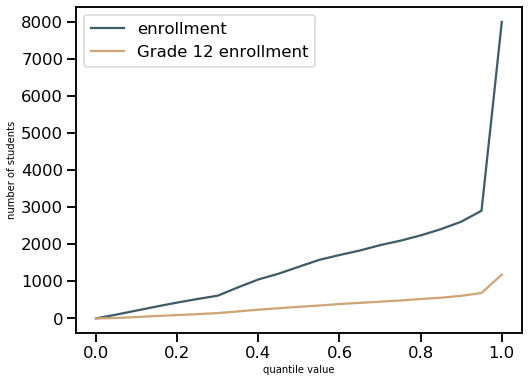

<IPython.core.display.Javascript object>

In [14]:
f, ax1 = plt.subplots(figsize=(8, 6))

ax1.plot(
    df_state_info_gs_census["enrollment"].quantile(np.arange(0, 1.05, 0.05)),
    color=B_slate,
    label="enrollment",
)
ax1.plot(
    df_state_info_gs_census["E12"].quantile(np.arange(0, 1.05, 0.05)),
    color=B_beige,
    label="Grade 12 enrollment",
)
ax1.set_ylabel("number of students")
ax1.set_xlabel("quantile value")
ax1.legend()

**I will look at schools with at least 25 students enrolled in 12th grade**

In [493]:
print(
    "No. of schools BEFORE filter of >= 25 students enrolled in 12th grade: {0:d}".format(
        df_state_info_gs_census.shape[0]
    )
)

No. of schools BEFORE filter of >= 25 students enrolled in 12th grade: 1110


<IPython.core.display.Javascript object>

In [494]:
df_state_info_gs_census = df_state_info_gs_census[
    df_state_info_gs_census["E12"] >= 25
].copy()

<IPython.core.display.Javascript object>

In [495]:
print(
    "No. of schools AFTER filter of >= 25 students enrolled in 12th grade: {0:d}".format(
        df_state_info_gs_census.shape[0]
    )
)

No. of schools AFTER filter of >= 25 students enrolled in 12th grade: 1031


<IPython.core.display.Javascript object>

## Feature engineering and categories

**Generate a non low income college eligibility percentage**

Given:
- pct low income students
- pct of all students college eligible
- pct of low income that are college eligible (SPLICE)
- enrollment, including grade 12

Get:
- pct non low income students  = 100 - (pct_LI_students)
- number graduated from E12

In [496]:
df_state_info_gs_census[
    [
        "School",
        "enrollment",
        "ETOT",
        "E12",
        "pct_LI_students",
        "graduation_rates_UCCSU_eligibility_LIstudents",
        "graduation_rates_UCCSU_eligibility_allStudents",
    ]
].head()

,School,enrollment,ETOT,E12,pct_LI_students,graduation_rates_UCCSU_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_allStudents
0,Envision Academy for Arts & Technology,407.0,407,88,67.0,100.0,100.0
1,Alameda High,1853.0,1718,381,18.0,50.0,66.0
2,Alternatives in Action,165.0,165,31,NaN,100.0,100.0
3,Lighthouse Community Charter High,214.0,260,59,80.0,100.0,100.0
4,Albany High,1210.0,1210,285,17.0,45.0,63.0


<IPython.core.display.Javascript object>

In [497]:
# Have a non low income college eligibility

# Given pct low income students
df_state_info_gs_census["pct_nonLI_students"] = (
    100 - df_state_info_gs_census["pct_LI_students"]
)
df_state_info_gs_census["est_LI_grade12_students"] = (
    df_state_info_gs_census["E12"] * 0.01 * df_state_info_gs_census["pct_LI_students"]
)
df_state_info_gs_census["est_nonLI_grade12_students"] = (
    df_state_info_gs_census["E12"]
    * 0.01
    * df_state_info_gs_census["pct_nonLI_students"]
)

df_state_info_gs_census["est_UCCSU_eligible_all"] = (
    df_state_info_gs_census["E12"]
    * 0.01
    * df_state_info_gs_census["graduation_rates_UCCSU_eligibility_allStudents"]
)
df_state_info_gs_census["est_UCCSU_eligible_LI"] = (
    df_state_info_gs_census["est_LI_grade12_students"]
    * 0.01
    * df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
)
df_state_info_gs_census["est_UCCSU_eligible_nonLI"] = (
    df_state_info_gs_census["est_UCCSU_eligible_all"]
    - df_state_info_gs_census["est_UCCSU_eligible_LI"]
)
df_state_info_gs_census["graduation_rates_UCCSU_eligibility_nonLIstudents"] = 100 * (
    df_state_info_gs_census["est_UCCSU_eligible_nonLI"]
    / df_state_info_gs_census["est_nonLI_grade12_students"]
)

df_state_info_gs_census["nonLI-LI_UCCSU_eligibility_gap"] = (
    df_state_info_gs_census["graduation_rates_UCCSU_eligibility_nonLIstudents"]
    - df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
)

<IPython.core.display.Javascript object>

In [498]:
df_state_info_gs_census[
    [
        "School",
        "enrollment",
        "ETOT",
        "E12",
        "est_LI_grade12_students",
        "pct_LI_students",
        "pct_nonLI_students",
        "graduation_rates_UCCSU_eligibility_LIstudents",
        "graduation_rates_UCCSU_eligibility_nonLIstudents",
        "graduation_rates_UCCSU_eligibility_allStudents",
        "nonLI-LI_UCCSU_eligibility_gap",
    ]
].head()

,School,enrollment,ETOT,E12,est_LI_grade12_students,pct_LI_students,pct_nonLI_students,graduation_rates_UCCSU_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_nonLIstudents,graduation_rates_UCCSU_eligibility_allStudents,nonLI-LI_UCCSU_eligibility_gap
0,Envision Academy for Arts & Technology,407.0,407,88,58.96,67.0,33.0,100.0,100.000000,100.0,0.000000e+00
1,Alameda High,1853.0,1718,381,68.58,18.0,82.0,50.0,69.512195,66.0,1.951220e+01
2,Alternatives in Action,165.0,165,31,NaN,NaN,NaN,100.0,NaN,100.0,NaN
3,Lighthouse Community Charter High,214.0,260,59,47.20,80.0,20.0,100.0,100.000000,100.0,4.263256e-14
4,Albany High,1210.0,1210,285,48.45,17.0,83.0,45.0,66.686747,63.0,2.168675e+01


<IPython.core.display.Javascript object>

### Filter for number of low income students in 12th grade

In [499]:
df_state_info_gs_census["est_LI_grade12_students"].quantile(np.arange(0, 1.1, 0.1))

0.0       2.75
0.1      36.00
0.2      61.42
0.3      88.26
0.4     113.56
0.5     149.04
0.6     195.72
0.7     252.49
0.8     307.80
0.9     384.67
1.0    1010.10
Name: est_LI_grade12_students, dtype: float64

<IPython.core.display.Javascript object>

Text(0.5, 0, 'quantile value')

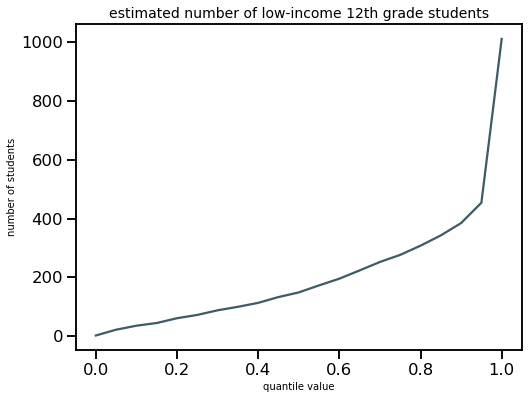

<IPython.core.display.Javascript object>

In [500]:
f, ax1 = plt.subplots(figsize=(8, 6))

ax1.plot(
    df_state_info_gs_census["est_LI_grade12_students"].quantile(
        np.arange(0, 1.05, 0.05)
    ),
    color=B_slate,
    label="enrollment",
)

ax1.set_title("estimated number of low-income 12th grade students")
ax1.set_ylabel("number of students")
ax1.set_xlabel("quantile value")

**I will filter for schools with an estimated number of at least 10 low income students in the 12th grade.**

In [501]:
df_state_info_gs_census = df_state_info_gs_census[
    df_state_info_gs_census["est_LI_grade12_students"] >= 10
].copy()

<IPython.core.display.Javascript object>

In [502]:
print(
    "No. of schools AFTER filter of >= 10 low income students enrolled in 12th grade: {0:d}".format(
        df_state_info_gs_census.shape[0]
    )
)

No. of schools AFTER filter of >= 10 low income students enrolled in 12th grade: 966


<IPython.core.display.Javascript object>

### Category-specific features

In [503]:
# Replace magnet and charter status with category encoding variables
df_state_info_gs_census["Magnet_cat_encoded"] = df_state_info_gs_census[
    "Magnet"
].replace({"No Data": None, "N": 0, "Y": 1})
df_state_info_gs_census["Charter_cat_encoded"] = df_state_info_gs_census[
    "Charter"
].replace({"No Data": None, "N": 0, "Y": 1})

<IPython.core.display.Javascript object>

In [504]:
[i for i in df_state_info_gs_census.columns.tolist()]

['NCESDist',
 'NCESSchool',
 'StatusType',
 'County',
 'District',
 'School',
 'Street',
 'StreetAbr',
 'City',
 'Zip',
 'State',
 'MailStreet',
 'MailStrAbr',
 'MailCity',
 'MailZip',
 'MailState',
 'Phone',
 'Ext',
 'WebSite',
 'OpenDate',
 'ClosedDate',
 'Charter',
 'CharterNum',
 'FundingType',
 'DOC',
 'DOCType',
 'SOC',
 'SOCType',
 'EdOpsCode',
 'EdOpsName',
 'EILCode',
 'EILName',
 'GSoffered',
 'GSserved',
 'Virtual',
 'Magnet',
 'YearRoundYN',
 'FederalDFCDistrictID',
 'Latitude',
 'Longitude',
 'AdmFName1',
 'AdmLName1',
 'AdmEmail1',
 'AdmFName2',
 'AdmLName2',
 'AdmEmail2',
 'AdmFName3',
 'AdmLName3',
 'AdmEmail3',
 'LastUpDate',
 'zip_code',
 'NCESDistSchool',
 'E9',
 'E10',
 'E11',
 'E12',
 'ETOT',
 'D9',
 'D10',
 'D11',
 'D12',
 'DTOT',
 '0_x',
 '1_x',
 '2_x',
 '3_x',
 '4_x',
 '5_x',
 '6_x',
 '7_x',
 '9_x',
 '0_y',
 '1_y',
 '2_y',
 '3_y',
 '4_y',
 '5_y',
 '6_y',
 '7_y',
 '9_y',
 '%_enrolled_of_total_Not reported',
 '%_dropout_within_Not reported',
 '%_enrolled_of_total_

<IPython.core.display.Javascript object>

In [505]:
# Percent ethnicity enrollment
col_pct_ethnicity = [
    i for i in df_state_info_gs_census.columns.tolist() if "%_enroll" in i
]

# Won't look at dropout columns but will get for census exclusion
col_pct_dropout = [
    i
    for i in df_state_info_gs_census.columns.tolist()
    if ("%" in i) and ("dropout") in i
]

col_pct_ethnicity

['%_enrolled_of_total_Not reported',
 '%_enrolled_of_total_Native Amer/Alaska Native',
 '%_enrolled_of_total_Asian',
 '%_enrolled_of_total_Pacific Islander',
 '%_enrolled_of_total_Filipino',
 '%_enrolled_of_total_Hispanic',
 '%_enrolled_of_total_African American',
 '%_enrolled_of_total_White',
 '%_enrolled_of_total_Two or More Races']

<IPython.core.display.Javascript object>

In [506]:
# School info columns
col_school_info_magnet_charter = ["Magnet_cat_encoded", "Charter_cat_encoded"]
col_school_info_magnet_charter

['Magnet_cat_encoded', 'Charter_cat_encoded']

<IPython.core.display.Javascript object>

In [507]:
# Census columns that start with '%'
col_census_pct = list(
    set(
        df_state_info_gs_census.columns[
            df_state_info_gs_census.columns.str.startswith("%")
        ]
    )
    - set(col_pct_ethnicity + col_pct_dropout)
)

col_census_pct.sort()

# Broad categories in pct census columns
print(set([i.split("-")[0] for i in col_census_pct]))

{'%; EMPLOY_STATUS ', '%; INCOME_BENEFITS ', '%; %', '%; INDUSTRY ', '%; OCCUPATION ', '%; WORK_COMMUTE ', '%; HEALTH_INS_COVERAGE ', '%; WORKER_CLASS '}


<IPython.core.display.Javascript object>

In [508]:
# Census income columns (starts with 'Est')
col_census_est = df_state_info_gs_census.columns[
    df_state_info_gs_census.columns.str.startswith("Est")
]
# Change so that all are numeric/float, using apply
df_state_info_gs_census[col_census_est] = (
    df_state_info_gs_census[col_census_est]
    .apply(pd.to_numeric, errors="coerce")
    .dropna()
    .astype("float")
)
col_census_est.tolist()

['Est.; INCOME_BENEFITS - Total households - Median household income ($)',
 'Est.; INCOME_BENEFITS - Total households - Mean household income ($)',
 'Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($)',
 'Est.; INCOME_BENEFITS - w/ retirement income',
 'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
 'Est.; INCOME_BENEFITS - w/ cash public assistance income',
 'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
 'Est.; INCOME_BENEFITS - Families - Median family income ($)',
 'Est.; INCOME_BENEFITS - Families - Mean family income ($)',
 'Est.; INCOME_BENEFITS - Per capita income ($)',
 'Est.; INCOME_BENEFITS - Nonfamily households - Median nonfamily income ($)',
 'Est.; INCOME_BENEFITS - Nonfamily households - Mean nonfamily income ($)']

<IPython.core.display.Javascript object>

In [509]:
# High level GS school rating columns
col_hl_ratings = [
    "college_readiness",
    "test_scores",
    "advanced_courses",
    "equity_overview",
    "race_ethnicity",
    "low_income",
    "disabilities",
]
col_gs_hl_ratings = ["gsRating"] + col_hl_ratings
# df_state_info_gs_census[col_gs_hl_ratings] = df_state_info_gs_census[col_gs_hl_ratings].apply(pd.to_numeric, errors='coerce').dropna().astype('float')
# Data types look like they're already float
# initial_analysis(df_state_info_gs_census[col_gs_hl_ratings])
col_gs_hl_ratings

['gsRating',
 'college_readiness',
 'test_scores',
 'advanced_courses',
 'equity_overview',
 'race_ethnicity',
 'low_income',
 'disabilities']

<IPython.core.display.Javascript object>

In [510]:
col_teacher_ratings = [
    "students_per_teacher",
    "students_per_counselor",
    "pct_teachers_3years_or_more",
    "pct_teachers_who_r_certified",
    "avg_teacher_salary",
]
col_teacher_ratings

['students_per_teacher',
 'students_per_counselor',
 'pct_teachers_3years_or_more',
 'pct_teachers_who_r_certified',
 'avg_teacher_salary']

<IPython.core.display.Javascript object>

In [511]:
col_lowincome_ratings = [
    "test_score_rating_allStudents",
    "test_score_rating_LIstudents",
    "test_score_rating_notLIstudents",
    "test_scores_english_allStudents",
    "test_scores_english_allStudents_n_students",
    "test_scores_english_LIstudents",
    "test_scores_english_LIstudents_n_students",
    "test_scores_math_allStudents",
    "test_scores_math_allStudents_n_students",
    "test_scores_math_LIstudents",
    "test_scores_math_LIstudents_n_students",
    "graduation_rates_UCCSU_eligibility_allStudents",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    "graduation_rates_UCCSU_eligibility_nonLIstudents",
    "graduation_rates_gradRates_eligibility_allStudents",
    "graduation_rates_gradRates_eligibility_LIstudents",
    "pct_LI_students",
]

# Need to remove target from this list without altering original list
col_lowincome_ratings_notarget = col_lowincome_ratings[:]
col_lowincome_ratings_notarget.remove("graduation_rates_UCCSU_eligibility_LIstudents")
col_lowincome_ratings_notarget

['test_score_rating_allStudents',
 'test_score_rating_LIstudents',
 'test_score_rating_notLIstudents',
 'test_scores_english_allStudents',
 'test_scores_english_allStudents_n_students',
 'test_scores_english_LIstudents',
 'test_scores_english_LIstudents_n_students',
 'test_scores_math_allStudents',
 'test_scores_math_allStudents_n_students',
 'test_scores_math_LIstudents',
 'test_scores_math_LIstudents_n_students',
 'graduation_rates_UCCSU_eligibility_allStudents',
 'graduation_rates_UCCSU_eligibility_nonLIstudents',
 'graduation_rates_gradRates_eligibility_allStudents',
 'graduation_rates_gradRates_eligibility_LIstudents',
 'pct_LI_students']

<IPython.core.display.Javascript object>

## First pass feature filtering

In [512]:
all_features = (
    ["enrollment", "E12"]
    + col_pct_ethnicity
    + col_census_pct
    + col_census_est.tolist()
    + col_school_info_magnet_charter
    + col_gs_hl_ratings
    + col_teacher_ratings
    + col_lowincome_ratings_notarget
)

<IPython.core.display.Javascript object>

In [513]:
# Check for features that have been duplicated
# [i for i in col_census_pct.tolist() if ("_y" not in i)]
all_features = [i for i in all_features if ("_y" not in i)]
all_features

['enrollment',
 'E12',
 '%_enrolled_of_total_Not reported',
 '%_enrolled_of_total_Native Amer/Alaska Native',
 '%_enrolled_of_total_Asian',
 '%_enrolled_of_total_Pacific Islander',
 '%_enrolled_of_total_Filipino',
 '%_enrolled_of_total_Hispanic',
 '%_enrolled_of_total_African American',
 '%_enrolled_of_total_White',
 '%_enrolled_of_total_Two or More Races',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18 yrs and up',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18-64 yrs',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - People in families',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - Unrelated individuals 15 yrs and up',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families - w/ related children of the householder <18 yrs',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All people',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families',


<IPython.core.display.Javascript object>

In [514]:
all_features_filt = (
    df_state_info_gs_census[all_features]
    .dropna(thresh=0.67 * len(df_state_info_gs_census), axis=1)
    .columns.tolist()
)

<IPython.core.display.Javascript object>

In [515]:
print(
    "No. of features where at least 2/3 of the schools have values for a feature: \n",
    len(all_features_filt),
)

No. of features where at least 2/3 of the schools have values for a feature: 
 147


<IPython.core.display.Javascript object>

In [516]:
# Identify which features were removed
print(
    "Features that had too many missing values: ",
    set(all_features) - set(all_features_filt),
)

Features that had too many missing values:  {'race_ethnicity', 'disabilities', 'advanced_courses'}


<IPython.core.display.Javascript object>

## Check for normally distributed features

In [517]:
# Looking at Shapiro-Wilk test - this is like taking the slope of a Q-Q plot https://www.youtube.com/watch?v=dRAqSsgkCUc
from scipy.stats import shapiro

counter = 0
for col in df_state_info_gs_census[all_features_filt].columns:
    try:
        stat, p = shapiro(df_state_info_gs_census[col])
        if p > 0.05:
            print(stat, p, col)
            counter += 1
    except:
        continue

nan 1.0 enrollment
nan 1.0 %; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force
nan 1.0 %; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - No health ins coverage
nan 1.0 %; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - w/ health ins coverage
nan 1.0 %; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - w/ health ins coverage - w/ private health insurance
nan 1.0 %; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - w/ health ins coverage - w/ public coverage
nan 1.0 Est.; INCOME_BENEFITS - Total households - Median household income ($)
nan 1.0 Est.; INCOME_BENEFITS - Total households - Mean household income ($)
nan 1.0 Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($)
nan 1.0 Est.; INCOME_BENEFITS - w/ reti

<IPython.core.display.Javascript object>

In [518]:
print(counter)

35


<IPython.core.display.Javascript object>

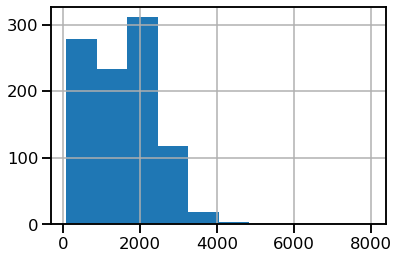

<IPython.core.display.Javascript object>

In [519]:
df_state_info_gs_census['enrollment'].hist()

In [520]:
len(all_features_filt)

147

<IPython.core.display.Javascript object>

# Checking features for linear models

I am considering applying linear models, with *inference* being a priority (understanding how my target is affected as the features change), several assumptions must be met.




## Evaluating for correlated features


From ISLR section [here](https://link.springer.com/chapter/10.1007/978-1-4614-7138-7_3#Sec14).
"Collinearity refers to the situation in which two or more predictor variables are closely related to one another...The presence of collinearity can pose problems in the regression context, since it can be difficult to separate out the individual effects of collinear variables on the response.... Since collinearity reduces the accuracy of the estimates of the regression coefficients, it causes the standard error for $\hat{\beta}_j$ to grow. Recall that the t-statistic for each predictor is calculated by dividing $\hat{\beta}_j$ by its standard error. Consequently, collinearity results in a decline in the t-statistic. As a result, in the presence of collinearity, we may fail to reject H0 : $\hat{\beta}_j$ = 0. This means that the power of the hypothesis test—the probability of correctly detecting a non-zero coefficient—is reduced by collinearity."

### Evaluate VIF - Variance inflation factor
A rule of thumb is that VIF should be less than 5 or 10. This is a somewhat arbitrary cut-off and may be dependent on the task.

In [521]:
# Calculating VIF with scipy.stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

<IPython.core.display.Javascript object>

In [522]:
def filter_and_std_data(X, y):
    """
    Keep rows only if there are no null values for that feature and target.
    Then standardize data.
    """
    k_rows2keep = pd.merge(X, y, left_index=True, right_index=True).notnull().sum(
        axis=1
    ) == (X.shape[1] + 1)
    print(
        "No. of total schools before splitting (no null values for feature set or target): ",
        sum(k_rows2keep),
    )

    X = X.loc[k_rows2keep, :].copy()
    y = y[k_rows2keep].copy()
    
    data = pd.concat([X,y], axis=1)
    
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    scaler.fit(data)
    data_scaled = (scaler.transform(data))
    
    return data_scaled[:, :-1], data_scaled[:, -1]

<IPython.core.display.Javascript object>

In [523]:
X_raw = df_state_info_gs_census[all_features_filt]
y_raw = df_state_info_gs_census['graduation_rates_UCCSU_eligibility_LIstudents']

<IPython.core.display.Javascript object>

In [524]:
X_raw.head()

,enrollment,E12,%_enrolled_of_total_Not reported,%_enrolled_of_total_Native Amer/Alaska Native,%_enrolled_of_total_Asian,%_enrolled_of_total_Pacific Islander,%_enrolled_of_total_Filipino,%_enrolled_of_total_Hispanic,%_enrolled_of_total_African American,%_enrolled_of_total_White,...,test_scores_english_LIstudents_n_students,test_scores_math_allStudents,test_scores_math_allStudents_n_students,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_nonLIstudents,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,pct_LI_students
0,407.0,88,1.965602,1.228501,1.719902,0.737101,0.245700,51.351351,38.329238,3.194103,...,77.0,20.0,96.0,18.0,77.0,100.0,100.000000,82.0,83.0,67.0
1,1853.0,381,0.058207,0.174622,40.337602,0.756694,5.296857,11.874272,6.519208,31.082654,...,100.0,58.0,401.0,49.0,104.0,66.0,69.512195,95.0,94.0,18.0
3,214.0,59,0.000000,0.000000,2.307692,0.000000,0.769231,83.846154,8.461538,2.692308,...,56.0,NaN,NaN,NaN,NaN,100.0,100.000000,75.0,77.0,80.0
4,1210.0,285,0.082645,0.247934,28.595041,0.330579,1.735537,16.611570,4.876033,37.190083,...,53.0,63.0,274.0,45.0,55.0,63.0,66.686747,93.0,92.0,17.0
5,3205.0,798,0.000000,0.353357,8.576935,0.192740,0.899454,21.426277,18.503052,39.511725,...,180.0,54.0,571.0,27.0,172.0,66.0,72.222222,89.0,89.0,28.0


<IPython.core.display.Javascript object>

In [525]:
X_filt, y_filt = filter_and_std_data(X_raw, y_raw)

No. of total schools before splitting (no null values for feature set or target):  811


<IPython.core.display.Javascript object>

In [526]:
# multiregression
X_filt_1 = sm.add_constant(X_filt)
lm = sm.OLS(endog=y_filt, exog=X_filt_1).fit()
variables = lm.model.exog

<IPython.core.display.Javascript object>

In [527]:
vif = [variance_inflation_factor(variables, i) for i in range(variables.shape[1])]

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/statsmodels/stats/outliers_influence.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


<IPython.core.display.Javascript object>

In [528]:
features_vif_vals = zip(X_raw.columns.tolist(), vif)
df_vif = pd.DataFrame(features_vif_vals)
df_vif

,0,1
0,enrollment,1.000000
1,E12,58.996148
2,%_enrolled_of_total_Not reported,37.943853
3,%_enrolled_of_total_Native Amer/Alaska Native,inf
4,%_enrolled_of_total_Asian,inf
...,...,...
142,graduation_rates_UCCSU_eligibility_allStudents,7245.168442
143,graduation_rates_UCCSU_eligibility_nonLIstudents,19.951589
144,graduation_rates_gradRates_eligibility_allStud...,17.114367
145,graduation_rates_gradRates_eligibility_LIstudents,17.755171


<IPython.core.display.Javascript object>

In [529]:
df_vif.iloc[0:15, :]

,0,1
0,enrollment,1.000000
1,E12,58.996148
2,%_enrolled_of_total_Not reported,37.943853
3,%_enrolled_of_total_Native Amer/Alaska Native,inf
4,%_enrolled_of_total_Asian,inf
5,%_enrolled_of_total_Pacific Islander,inf
6,%_enrolled_of_total_Filipino,inf
7,%_enrolled_of_total_Hispanic,inf
8,%_enrolled_of_total_African American,inf
9,%_enrolled_of_total_White,inf


<IPython.core.display.Javascript object>

In [530]:
df_vif[df_vif[1] < 10]

,0,1
0,enrollment,1.000000
29,%; EMPLOY_STATUS - Own children of the househo...,3.128844
30,%; EMPLOY_STATUS - Pop. 16 yrs and up - In lab...,2.897774
53,"%; INCOME_BENEFITS - Families - $10,000 to $14...",7.133226
76,%; INCOME_BENEFITS - w/ cash public assistance...,7.157824
110,Est.; INCOME_BENEFITS - w/ retirement income,7.850732
111,Est.; INCOME_BENEFITS - w/ retirement income -...,4.584159
112,Est.; INCOME_BENEFITS - w/ cash public assista...,4.316675
113,Est.; INCOME_BENEFITS - w/ cash public assista...,7.710084
114,Est.; INCOME_BENEFITS - Families - Median fami...,1.514602


<IPython.core.display.Javascript object>

In [531]:
### Create interactive terms? (not done)

<IPython.core.display.Javascript object>

### Try predictive power score

From Rashed [article](https://towardsdatascience.com/rip-correlation-introducing-the-predictive-power-score-3d90808b9598See)

In [532]:
df_state_info_gs_census[all_features_filt].shape

(966, 147)

<IPython.core.display.Javascript object>

In [533]:
import ppscore as pps

<IPython.core.display.Javascript object>

In [54]:
# Test ppscore with something we know that's highly correlated
pps.score(df_state_info_gs_census, 'graduation_rates_UCCSU_eligibility_nonLIstudents', 'graduation_rates_UCCSU_eligibility_LIstudents')

{'x': 'graduation_rates_UCCSU_eligibility_nonLIstudents',
 'y': 'graduation_rates_UCCSU_eligibility_LIstudents',
 'task': 'regression',
 'ppscore': 0.38087758017661466,
 'metric': 'mean absolute error',
 'baseline_score': 14.528856243441762,
 'model_score': 8.995140634705765,
 'model': DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')}

<IPython.core.display.Javascript object>

In [55]:
# Test ppscore with something we know that's NOT highly correlated
pps.score(df_state_info_gs_census, 'avg_teacher_salary', 'graduation_rates_UCCSU_eligibility_LIstudents')

{'x': 'avg_teacher_salary',
 'y': 'graduation_rates_UCCSU_eligibility_LIstudents',
 'task': 'regression',
 'ppscore': 0,
 'metric': 'mean absolute error',
 'baseline_score': 14.204883227176222,
 'model_score': 19.93076090876307,
 'model': DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')}

<IPython.core.display.Javascript object>

In [61]:
# Test pps.matrix with more data, but not all (first 5 columns and last 5 columns)
df_pps_mat = pps.matrix(df_state_info_gs_census[all_features_filt[0:5] + all_features_filt[-5::]])
df_pps_mat

,enrollment,E12,%_enrolled_of_total_Not reported,%_enrolled_of_total_Native Amer/Alaska Native,%_enrolled_of_total_Asian,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_nonLIstudents,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,pct_LI_students
enrollment,1.000000,0.758306,0,0,0,0.063825,0.000000,0.021940,0.036685,0.000000
E12,0.783753,1.000000,0,0,0,0.057779,0.000000,0.049607,0.036313,0.017721
%_enrolled_of_total_Not reported,0.000000,0.000000,1,0,0,0.000000,0.000000,0.000000,0.000000,0.000000
%_enrolled_of_total_Native Amer/Alaska Native,0.000000,0.000000,0,1,0,0.000000,0.000000,0.000000,0.000000,0.000000
%_enrolled_of_total_Asian,0.000000,0.000000,0,0,1,0.000000,0.000000,0.000000,0.000000,0.000000
graduation_rates_UCCSU_eligibility_allStudents,0.000000,0.000000,0,0,0,1.000000,0.677719,0.007972,0.000000,0.071644
graduation_rates_UCCSU_eligibility_nonLIstudents,0.000000,0.000000,0,0,0,0.729507,1.000000,0.027600,0.000000,0.041821
graduation_rates_gradRates_eligibility_allStudents,0.000000,0.000000,0,0,0,0.000000,0.000000,1.000000,0.697461,0.000000
graduation_rates_gradRates_eligibility_LIstudents,0.000000,0.000000,0,0,0,0.000000,0.000000,0.706018,1.000000,0.000000
pct_LI_students,0.000000,0.000000,0,0,0,0.072239,0.000000,0.147051,0.029947,1.000000


<IPython.core.display.Javascript object>

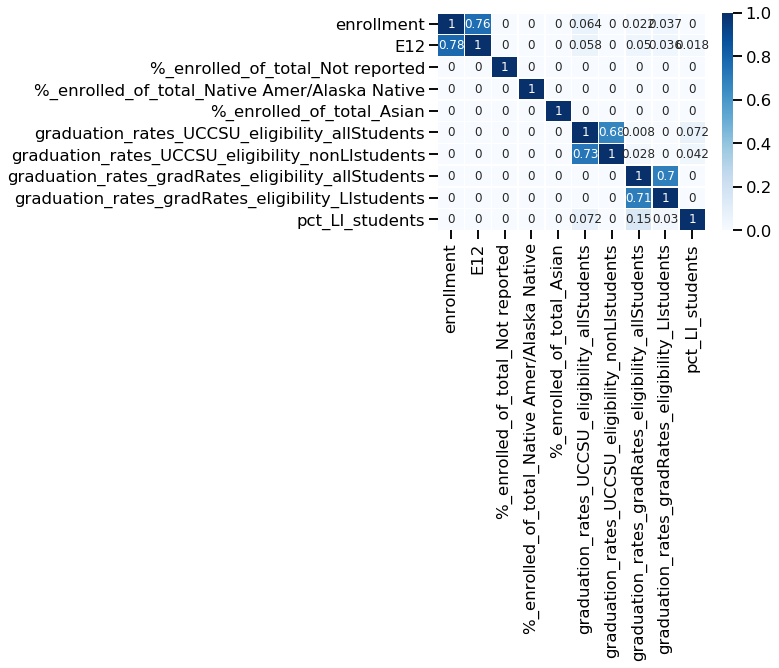

<IPython.core.display.Javascript object>

In [62]:
sns.heatmap(df_pps_mat, vmin=0, vmax=1, cmap="Blues", linewidths=0.5, annot=True)

In [68]:
# Test pps.matrix with all data
df_pps_mat_all = pps.matrix(df_state_info_gs_census[all_features_filt + ['graduation_rates_UCCSU_eligibility_LIstudents']])
df_pps_mat_all

,enrollment,E12,%_enrolled_of_total_Not reported,%_enrolled_of_total_Native Amer/Alaska Native,%_enrolled_of_total_Asian,%_enrolled_of_total_Pacific Islander,%_enrolled_of_total_Filipino,%_enrolled_of_total_Hispanic,%_enrolled_of_total_African American,%_enrolled_of_total_White,...,test_scores_math_allStudents,test_scores_math_allStudents_n_students,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_nonLIstudents,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,pct_LI_students,graduation_rates_UCCSU_eligibility_LIstudents
enrollment,1.000000,0.758306,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,...,0.012233,0.742773,0.000000,0.131778,0.063825,0.000000,0.021940,0.036685,0.000000,0.093824
E12,0.783753,1.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,...,0.026292,0.712749,0.015296,0.069253,0.057779,0.000000,0.049607,0.036313,0.017721,0.092557
%_enrolled_of_total_Not reported,0.000000,0.000000,1.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
%_enrolled_of_total_Native Amer/Alaska Native,0.000000,0.000000,0.0,1.0,0.0,0.0,0.0,0.000000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
%_enrolled_of_total_Asian,0.000000,0.000000,0.0,0.0,1.0,0.0,0.0,0.000000,0.0,0.000000,...,0.054999,0.000000,0.067345,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
graduation_rates_UCCSU_eligibility_nonLIstudents,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,...,0.129644,0.000000,0.109559,0.000000,0.729507,1.000000,0.027600,0.000000,0.041821,0.401086
graduation_rates_gradRates_eligibility_allStudents,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,...,0.004920,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.697461,0.000000,0.000000
graduation_rates_gradRates_eligibility_LIstudents,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.706018,1.000000,0.000000,0.000000
pct_LI_students,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.267059,0.0,0.208268,...,0.330481,0.000000,0.118905,0.008424,0.072239,0.000000,0.147051,0.029947,1.000000,0.000000


<IPython.core.display.Javascript object>

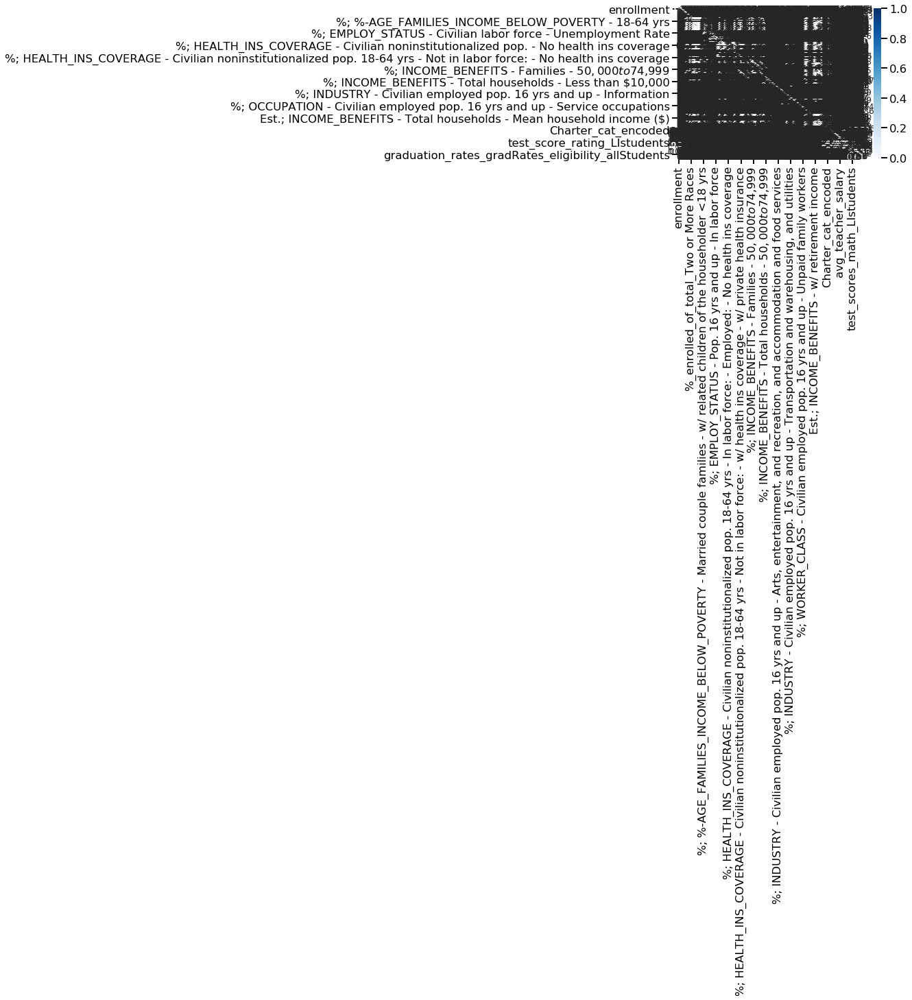

<IPython.core.display.Javascript object>

In [69]:
sns.heatmap(df_pps_mat_all, vmin=0, vmax=1, cmap="Blues", linewidths=0.5, annot=True)

In [70]:
df_pps_mat_all.head()

,enrollment,E12,%_enrolled_of_total_Not reported,%_enrolled_of_total_Native Amer/Alaska Native,%_enrolled_of_total_Asian,%_enrolled_of_total_Pacific Islander,%_enrolled_of_total_Filipino,%_enrolled_of_total_Hispanic,%_enrolled_of_total_African American,%_enrolled_of_total_White,...,test_scores_math_allStudents,test_scores_math_allStudents_n_students,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_nonLIstudents,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,pct_LI_students,graduation_rates_UCCSU_eligibility_LIstudents
enrollment,1.000000,0.758306,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.012233,0.742773,0.000000,0.131778,0.063825,0.0,0.021940,0.036685,0.000000,0.093824
E12,0.783753,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.026292,0.712749,0.015296,0.069253,0.057779,0.0,0.049607,0.036313,0.017721,0.092557
%_enrolled_of_total_Not reported,0.000000,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
%_enrolled_of_total_Native Amer/Alaska Native,0.000000,0.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
%_enrolled_of_total_Asian,0.000000,0.000000,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.054999,0.000000,0.067345,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000


<IPython.core.display.Javascript object>

In [72]:
df_pps_target = df_pps_mat_all.sort_values(by='graduation_rates_UCCSU_eligibility_LIstudents', ascending=False)['graduation_rates_UCCSU_eligibility_LIstudents']

<IPython.core.display.Javascript object>

In [80]:
df_pps_target.iloc[0:25]

graduation_rates_UCCSU_eligibility_LIstudents                                                                      1.000000
graduation_rates_UCCSU_eligibility_allStudents                                                                     0.584339
Charter_cat_encoded                                                                                                0.512970
graduation_rates_UCCSU_eligibility_nonLIstudents                                                                   0.401086
test_score_rating_LIstudents                                                                                       0.117700
low_income                                                                                                         0.116447
test_scores_math_allStudents_n_students                                                                            0.115889
test_scores_english_allStudents_n_students                                                                         0.102069
enrollme

<IPython.core.display.Javascript object>

In [77]:
df_pps_target.value_counts()

0.000000    129
0.013930      1
0.084561      1
0.082883      1
0.512970      1
0.019035      1
0.102069      1
0.116447      1
0.401086      1
0.089115      1
0.117700      1
0.584339      1
0.088973      1
0.025429      1
0.093824      1
0.092557      1
0.115889      1
0.093124      1
0.070805      1
1.000000      1
Name: graduation_rates_UCCSU_eligibility_LIstudents, dtype: int64

<IPython.core.display.Javascript object>

# Inspect some features manually for selection

In [538]:
df_state_info_gs_census.shape

(966, 274)

<IPython.core.display.Javascript object>

In [600]:
def create_simple_names(str2split, names_list):
    """
    Create simple names by indicating substring common to all labels
    """
    simple_names = [i.split(str2split)[1] for i in names_list]
    simple_names_dict = dict(zip(names_list, simple_names))
    return simple_names, simple_names_dict

<IPython.core.display.Javascript object>

In [ ]:
def pairplot_w_simplenames(colnames_list, str2split):
    """
    Create a pairplot and use simple names by indicating substring common to all labels
    """
    
    g = sns.pairplot(df_state_info_gs_census[colnames_list])
    colnames_list_simple, replacements = create_simple_names(str2split, colnames_list)

    for i in range(len(colnames_list)):
        for j in range(len(colnames_list)):
            xlabel = g.axes[i][j].get_xlabel()
            ylabel = g.axes[i][j].get_ylabel()
            if xlabel in replacements.keys():
                g.axes[i][j].set_xlabel(replacements[xlabel])
            if ylabel in replacements.keys():
                g.axes[i][j].set_ylabel(replacements[ylabel])

## Ethnicity categories

In [535]:
col_pct_ethnicity

['%_enrolled_of_total_Not reported',
 '%_enrolled_of_total_Native Amer/Alaska Native',
 '%_enrolled_of_total_Asian',
 '%_enrolled_of_total_Pacific Islander',
 '%_enrolled_of_total_Filipino',
 '%_enrolled_of_total_Hispanic',
 '%_enrolled_of_total_African American',
 '%_enrolled_of_total_White',
 '%_enrolled_of_total_Two or More Races']

<IPython.core.display.Javascript object>

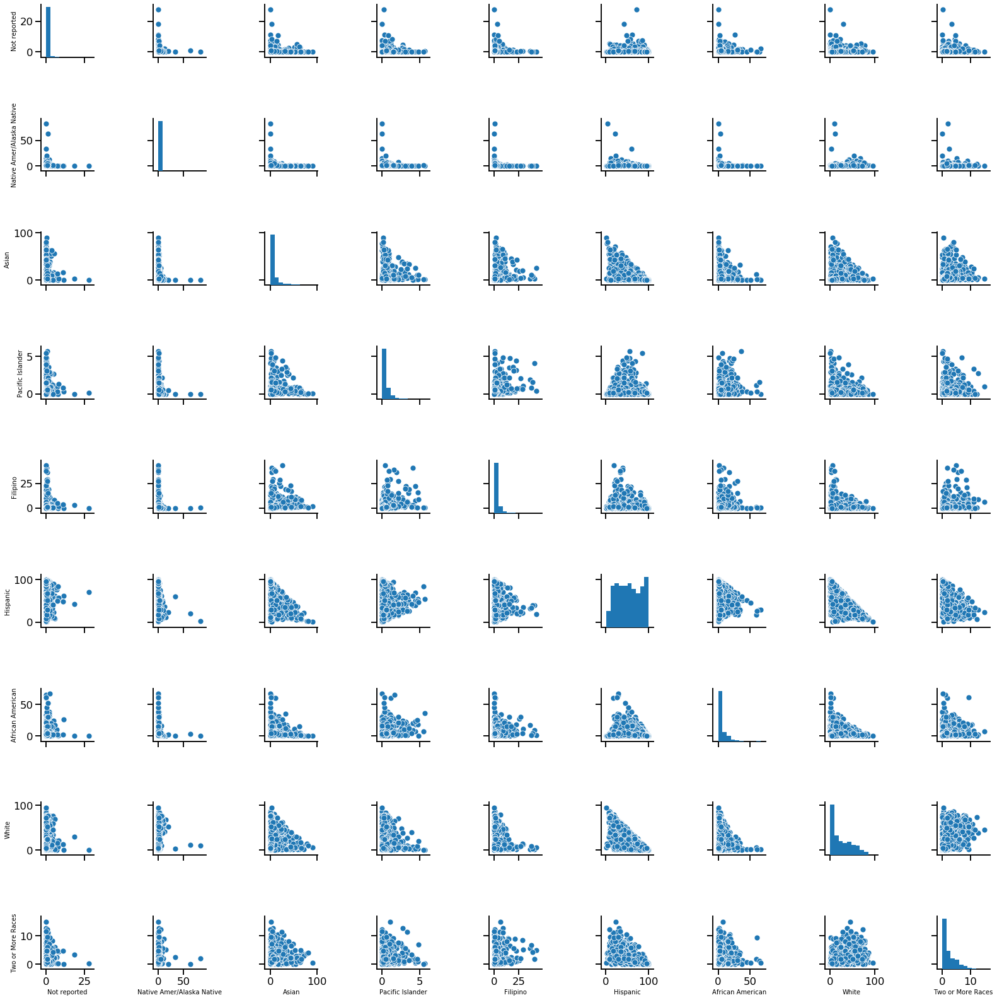

<IPython.core.display.Javascript object>

In [612]:
pairplot_w_simplenames(col_pct_ethnicity, '%_enrolled_of_total_')

In [616]:
ethnicity_simple_names, ethnicity_simple_names_dict = create_simple_names('%_enrolled_of_total_', col_pct_ethnicity)

<IPython.core.display.Javascript object>

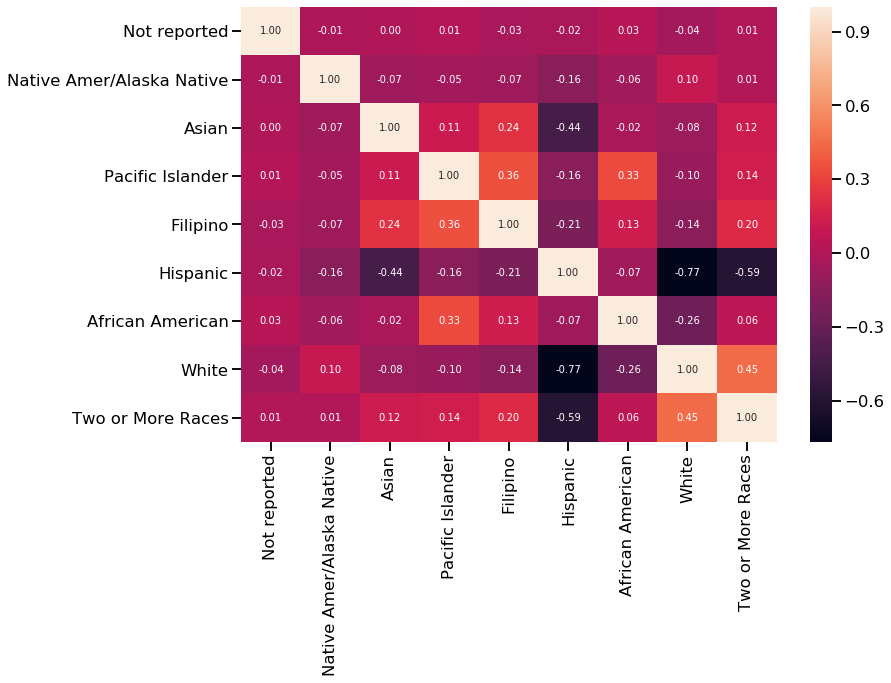

<IPython.core.display.Javascript object>

In [618]:
# Check for correlated and anti-correlated features - done before and after column filtering
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(
    df_state_info_gs_census[col_pct_ethnicity].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

ax.set_xticklabels(ethnicity_simple_names)
ax.set_yticklabels(ethnicity_simple_names);

In [619]:
df_state_info_gs_census[col_pct_ethnicity].median().sort_values(ascending=False)

%_enrolled_of_total_Hispanic                     52.785906
%_enrolled_of_total_White                        18.922201
%_enrolled_of_total_Asian                         2.726716
%_enrolled_of_total_African American              2.548434
%_enrolled_of_total_Two or More Races             1.470752
%_enrolled_of_total_Filipino                      1.264495
%_enrolled_of_total_Native Amer/Alaska Native     0.350556
%_enrolled_of_total_Pacific Islander              0.311252
%_enrolled_of_total_Not reported                  0.078896
dtype: float64

<IPython.core.display.Javascript object>

**I will create an feature for percentage of students that are from underrepresented minorities (pct_URM). Since the percentage of whites and Hispanics are negatively correlated, the percenteage of whites can also be inferred from this metric.**

In [620]:
df_state_info_gs_census['pct_URM'] = df_state_info_gs_census[['%_enrolled_of_total_Hispanic', '%_enrolled_of_total_African American', '%_enrolled_of_total_Native Amer/Alaska Native']].sum(axis=1)

<IPython.core.display.Javascript object>

In [621]:
df_state_info_gs_census['pct_URM'].head()

0    90.909091
1    18.568102
3    92.307692
4    21.735537
5    40.282686
Name: pct_URM, dtype: float64

<IPython.core.display.Javascript object>

In [545]:
df_state_info_gs_census.head()

,NCESDist,NCESSchool,StatusType,County,District,School,Street,StreetAbr,City,Zip,...,est_LI_grade12_students,est_nonLI_grade12_students,est_UCCSU_eligible_all,est_UCCSU_eligible_LI,est_UCCSU_eligible_nonLI,graduation_rates_UCCSU_eligibility_nonLIstudents,nonLI-LI_UCCSU_eligibility_gap,Magnet_cat_encoded,Charter_cat_encoded,pct_URM
0,691051,10947,Active,Alameda,Alameda County Office of Education,Envision Academy for Arts & Technology,1515 Webster Street,1515 Webster St.,Oakland,94612-3355,...,58.96,29.04,88.00,58.9600,29.0400,100.000000,0.000000e+00,0,1,90.909091
1,601770,41,Active,Alameda,Alameda Unified,Alameda High,2200 Central Avenue,2200 Central Ave.,Alameda,94501-4406,...,68.58,312.42,251.46,34.2900,217.1700,69.512195,1.951220e+01,0,0,18.568102
3,628050,10726,Active,Alameda,Oakland Unified,Lighthouse Community Charter High,444 Hegenberger Road,444 Hegenberger Rd.,Oakland,94621-1418,...,47.20,11.80,59.00,47.2000,11.8000,100.000000,4.263256e-14,0,1,92.307692
4,601860,59,Active,Alameda,Albany City Unified,Albany High,603 Key Route Boulevard,603 Key Route Blvd.,Albany,94706-1422,...,48.45,236.55,179.55,21.8025,157.7475,66.686747,2.168675e+01,0,0,21.735537
5,604740,432,Active,Alameda,Berkeley Unified,Berkeley High,1980 Allston Way,1980 Allston Way,Berkeley,94704-1463,...,223.44,574.56,526.68,111.7200,414.9600,72.222222,2.222222e+01,0,0,40.282686


<IPython.core.display.Javascript object>

## Census category text inspection

Before filtering:
- INCOME_BENEFITS - percentage (28 columns) - check for redundant columns and correlated and anti-correlated features
- INCOME_BENEFITS - estimated values - (12 columns) - manually select features
- HEALTH_INS_COVERAGE (17 columns) - manually select columns
- WORK_COMMUTE - adds to 100% (6 columns) - interesting to keep, but drop rare categories
- OCCUPATION - adds to 100% (5 columns) - perhaps drop - may be redundant with industry
- INDUSTRY - adds to 100% (13 columns) - interesting to keep but inspect
- WORKER_CLASS - adds to 100% (4 columns) - OK to keep but inspect
- EMPLOY_STATUS - (12 columns) - OK to keep but inspect
- %-AGE_FAMILIES_INCOME_BELOW_POVERTY (13 columns) - follow up


### Income benefits columns

In [622]:
# Preview columns
col_census_pct[0:10]

['%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18 yrs and up',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18-64 yrs',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - People in families',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - Unrelated individuals 15 yrs and up',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families - w/ related children of the householder <18 yrs',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All people',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families',
 '%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families - w/ related children of the householder <18 yrs']

<IPython.core.display.Javascript object>

In [623]:
# Preview columns
col_census_est

Index(['Est.; INCOME_BENEFITS - Total households - Median household income ($)',
       'Est.; INCOME_BENEFITS - Total households - Mean household income ($)',
       'Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($)',
       'Est.; INCOME_BENEFITS - w/ retirement income',
       'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
       'Est.; INCOME_BENEFITS - Families - Median family income ($)',
       'Est.; INCOME_BENEFITS - Families - Mean family income ($)',
       'Est.; INCOME_BENEFITS - Per capita income ($)',
       'Est.; INCOME_BENEFITS - Nonfamily households - Median nonfamily income ($)',
       'Est.; INCOME_BENEFITS - Nonfamily households - Mean nonfamily income ($)'],
      dtype='object')

<IPython.core.display.Javascript object>

#### Evaluation of pct income benefits columns

In [626]:
col_census_pct_ib = [i for i in col_census_pct if "INCOME_BENEFITS" in i]

# This is if the object were column names
# col_census_pct[
#     df_state_info_gs_census[col_census_pct].columns.str.contains("INCOME_BENEFITS")
# ].tolist()

# Drop columns containing '%; INCOME_BENEFITS - Families -' since it's redundant with '%; INCOME_BENEFITS - Total households - '
col2drop = [i for i in col_census_pct if "%; INCOME_BENEFITS - Families" in i]

# This is if the object were column names
# col_census_pct[
#     df_state_info_gs_census[col_census_pct].columns.str.contains(
#         "%; INCOME_BENEFITS - Families"
#     )
# ].tolist()


# Drop duplicated columns
col2drop = col2drop + [
    "%; INCOME_BENEFITS - w/ retirement income_y",
    "%; INCOME_BENEFITS - w/ cash public assistance income_y",
]

col_census_pct_ib = list(set(col_census_pct_ib) - set(col2drop))

# Iteration 1 - hand select other columns to account for correlations anti-correlations, etc.
col_census_pct_ib = [
    "%; INCOME_BENEFITS - Total households - Less than $10,000",
    "%; INCOME_BENEFITS - Total households - $10,000 to $14,999",
    "%; INCOME_BENEFITS - Total households - $15,000 to $24,999",
    "%; INCOME_BENEFITS - Total households - $25,000 to $34,999",
    "%; INCOME_BENEFITS - Total households - $35,000 to $49,999",
    "%; INCOME_BENEFITS - Total households - $50,000 to $74,999",
    "%; INCOME_BENEFITS - Total households - $75,000 to $99,999",
    "%; INCOME_BENEFITS - Total households - $100,000 to $149,999",
    "%; INCOME_BENEFITS - Total households - $150,000 to $199,999",
    "%; INCOME_BENEFITS - Total households - $200,000 or more",
    "%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months",
    "%; INCOME_BENEFITS - w/ Social Security",
    "%; INCOME_BENEFITS - w/ Supplemental Security Income",
]

<IPython.core.display.Javascript object>

In [627]:
col_census_pct_ib_simplenames, col_census_pct_ib_simplenames_dict = create_simple_names('%; INCOME_BENEFITS - ', col_census_pct_ib)

<IPython.core.display.Javascript object>

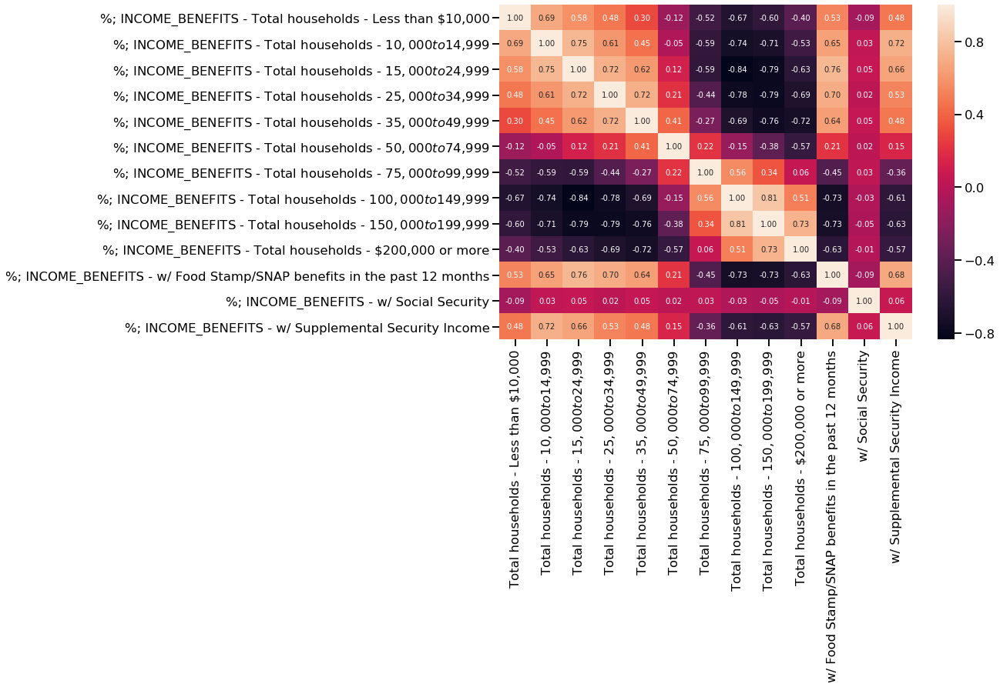

<IPython.core.display.Javascript object>

In [632]:
# Check for correlated and anti-correlated features - done before and after column filtering
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_ib].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

ax.set_xticklabels(col_census_pct_ib_simplenames);

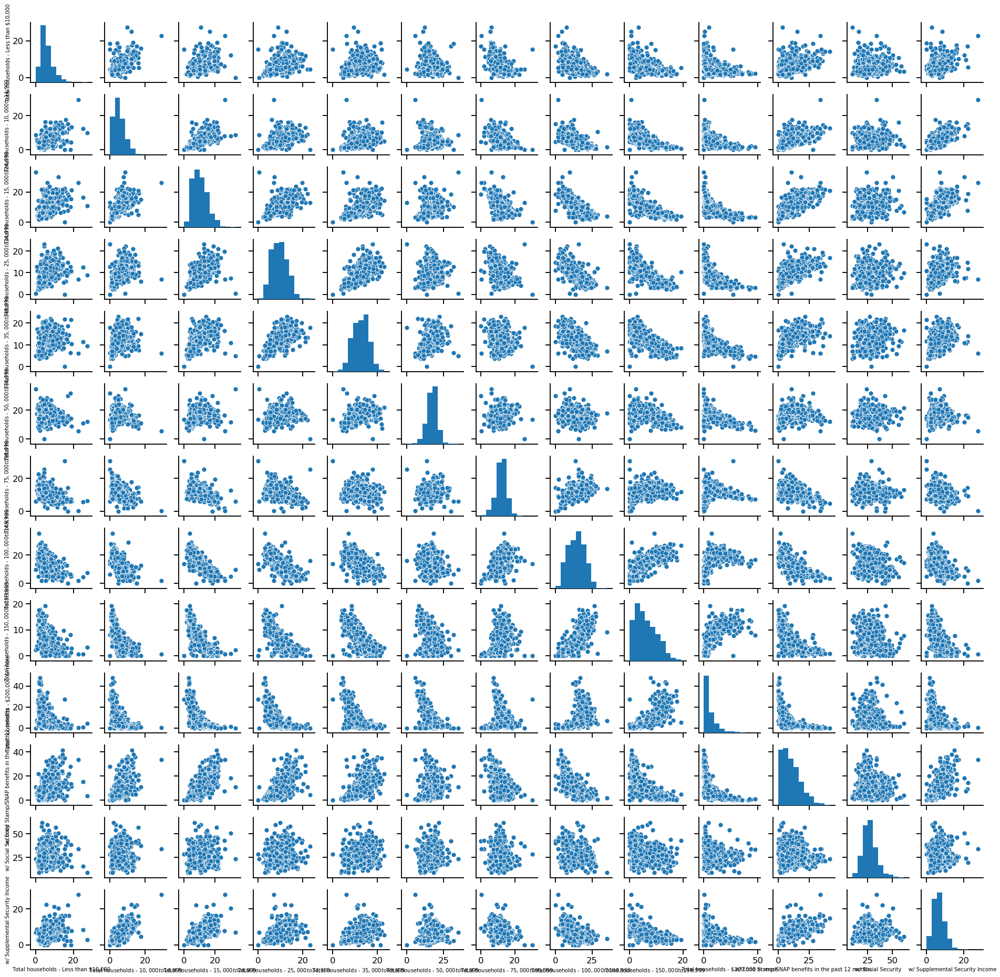

<IPython.core.display.Javascript object>

In [634]:
# Categorical breakdown of percent ib

pairplot_w_simplenames(col_census_pct_ib, '%; INCOME_BENEFITS - ')

In [553]:
# Iteration 2 - hand select other columns to account for correlations anti-correlations, etc.

# % cash public assistance correlates with Food Stamp benefits
col_census_pct_ib_final = [
    "%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months",
    "%; INCOME_BENEFITS - w/ Social Security",
    "%; INCOME_BENEFITS - w/ Supplemental Security Income",
]

<IPython.core.display.Javascript object>

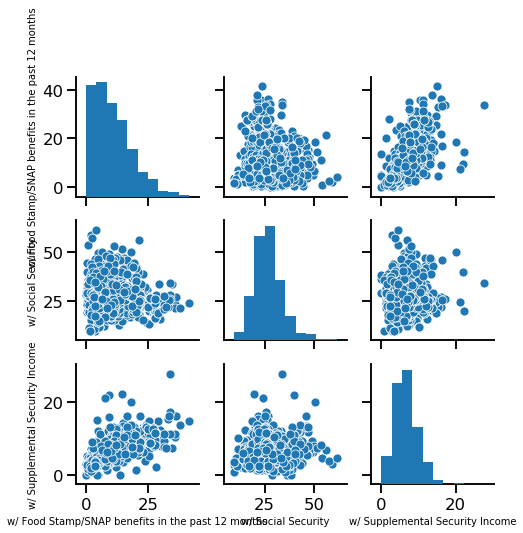

<IPython.core.display.Javascript object>

In [635]:
# Categorical breakdown of percent household income after feature culling
col_census_pct_ib_final_simplenames, col_census_pct_ib_final_simplenames_dict = create_simple_names('%; INCOME_BENEFITS - ', col_census_pct_ib_final)

pairplot_w_simplenames(col_census_pct_ib_final, '%; INCOME_BENEFITS - ');

#### Evaluation of estimated income benefits

In [556]:
col_census_est_ib = col_census_est[
    df_state_info_gs_census[col_census_est].columns.str.contains("INCOME_BENEFITS")
]
col_census_est_ib

Index(['Est.; INCOME_BENEFITS - Total households - Median household income ($)',
       'Est.; INCOME_BENEFITS - Total households - Mean household income ($)',
       'Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($)',
       'Est.; INCOME_BENEFITS - w/ retirement income',
       'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
       'Est.; INCOME_BENEFITS - Families - Median family income ($)',
       'Est.; INCOME_BENEFITS - Families - Mean family income ($)',
       'Est.; INCOME_BENEFITS - Per capita income ($)',
       'Est.; INCOME_BENEFITS - Nonfamily households - Median nonfamily income ($)',
       'Est.; INCOME_BENEFITS - Nonfamily households - Mean nonfamily income ($)'],
      dtype='object')

<IPython.core.display.Javascript object>

In [636]:
col_census_est_ib_simple_names, col_census_est_ib_simple_names_dict = create_simple_names('Est.; INCOME_BENEFITS - ', col_census_est_ib)

<IPython.core.display.Javascript object>

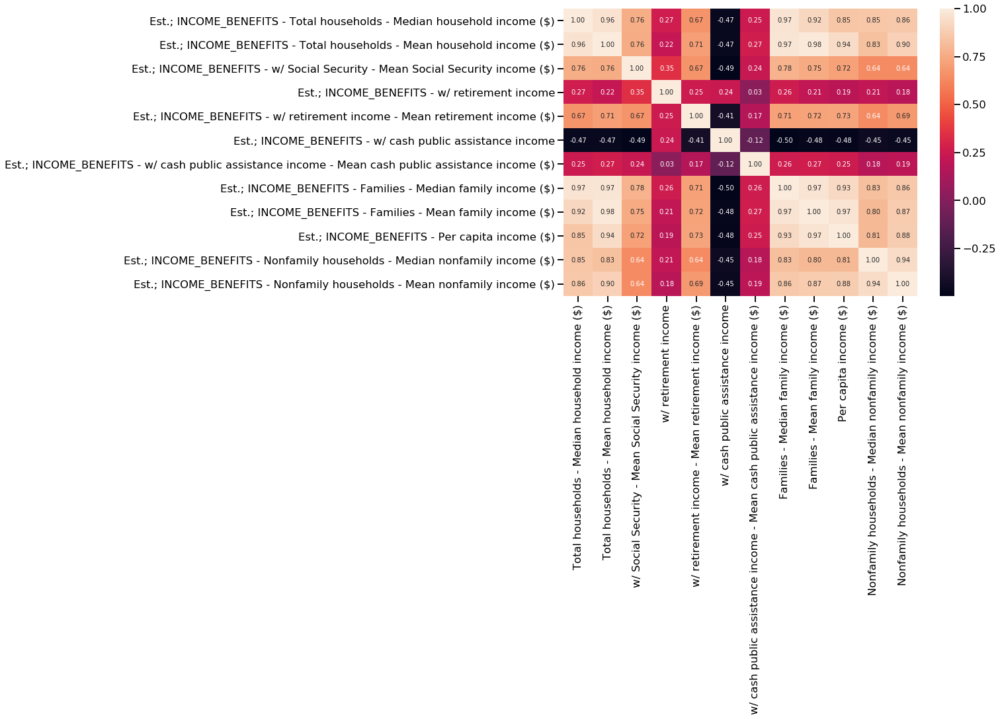

<IPython.core.display.Javascript object>

In [639]:
# Check for correlated and anti-correlated features - done before and after column filtering
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_est_ib].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

ax.set_xticklabels(col_census_est_ib_simple_names);

In [640]:
# Iteration 1 - hand select other columns to account for correlations anti-correlations, etc.

col_census_est_ib_final = [
    "Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    "Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)",
    "Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)",
]

col_census_est_ib_final_simplenames, col_census_est_ib_final_simplenames_dict = create_simple_names('Est.; INCOME_BENEFITS - ', col_census_est_ib_final)

<IPython.core.display.Javascript object>

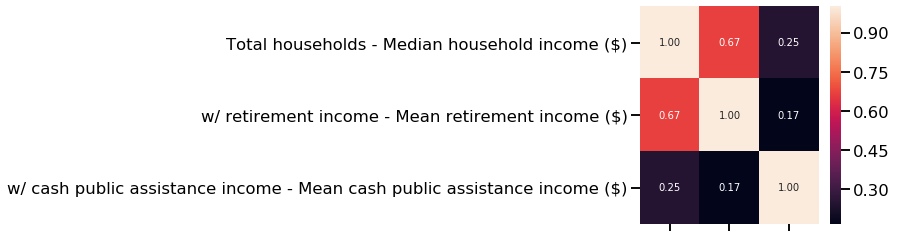

<IPython.core.display.Javascript object>

In [644]:
# Check for correlated and anti-correlated features - done before and after column filtering
fig, ax = plt.subplots(figsize=(4, 4))
sns.heatmap(
    df_state_info_gs_census[col_census_est_ib_final].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

ax.set_yticklabels(col_census_est_ib_final_simplenames)
ax.set_xticklabels('');

#### Playspace with text inspection

In [645]:
category_col = col_census_est[
    df_state_info_gs_census[col_census_est].columns.str.contains("INCOME_BENEFITS")
]
len(category_col)

12

<IPython.core.display.Javascript object>

In [646]:
df_state_info_gs_census[category_col].head()

,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - Total households - Mean household income ($),Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($),Est.; INCOME_BENEFITS - w/ retirement income,Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income,Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),Est.; INCOME_BENEFITS - Families - Median family income ($),Est.; INCOME_BENEFITS - Families - Mean family income ($),Est.; INCOME_BENEFITS - Per capita income ($),Est.; INCOME_BENEFITS - Nonfamily households - Median nonfamily income ($),Est.; INCOME_BENEFITS - Nonfamily households - Mean nonfamily income ($)
0,32993.0,55911.0,12978.0,659.0,29027.0,368.0,5055.0,38980.0,67067.0,32425.0,29122.0,51831.0
1,72884.0,99612.0,17113.0,3804.0,32115.0,827.0,4632.0,88693.0,118416.0,41592.0,52815.0,67936.0
3,31903.0,43104.0,12293.0,1086.0,19269.0,1268.0,5347.0,34633.0,44970.0,13082.0,18963.0,28948.0
4,80970.0,105995.0,17921.0,1085.0,36487.0,83.0,4229.0,95880.0,118328.0,42019.0,49099.0,74376.0
5,26478.0,53679.0,13075.0,382.0,40397.0,78.0,8172.0,64432.0,102605.0,20723.0,20313.0,41671.0


<IPython.core.display.Javascript object>

In [647]:
df_state_info_gs_census[category_col].sum(axis=1)

0       356416.0
1       600439.0
3       254866.0
4       626472.0
5       392005.0
          ...   
1105    434406.0
1106    367796.0
1107    342714.0
1108    342714.0
1109    430859.0
Length: 966, dtype: float64

<IPython.core.display.Javascript object>

#### Examination space with visualizations of various features

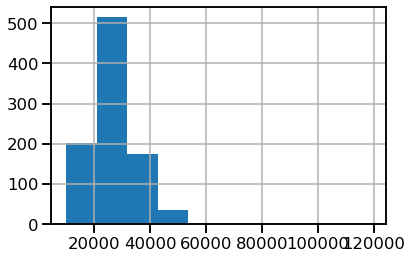

<IPython.core.display.Javascript object>

In [648]:
# Histogram
df_state_info_gs_census[category_col].iloc[:, 4].hist()

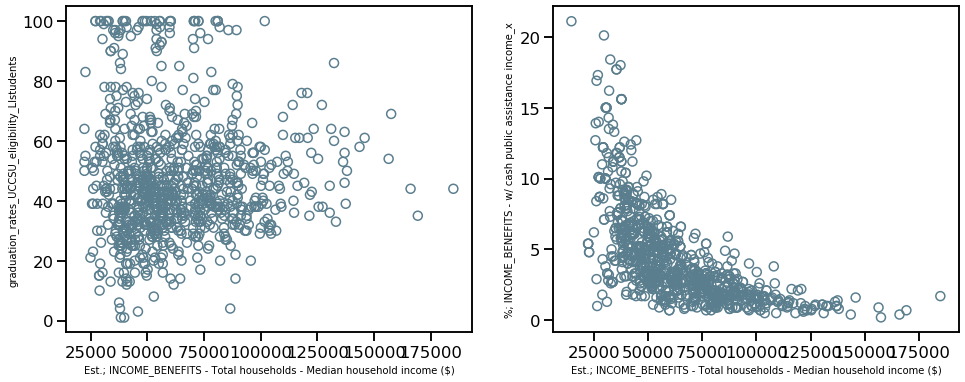

<IPython.core.display.Javascript object>

In [651]:
# Scatter plots
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(df_state_info_gs_census, 
                          'Est.; INCOME_BENEFITS - Total households - Median household income ($)', 
                          'graduation_rates_UCCSU_eligibility_LIstudents', 
                          ax1)

scatter_plot_open_circles(df_state_info_gs_census, 
                          'Est.; INCOME_BENEFITS - Total households - Median household income ($)', 
                          '%; INCOME_BENEFITS - w/ cash public assistance income_x', 
                          ax2)

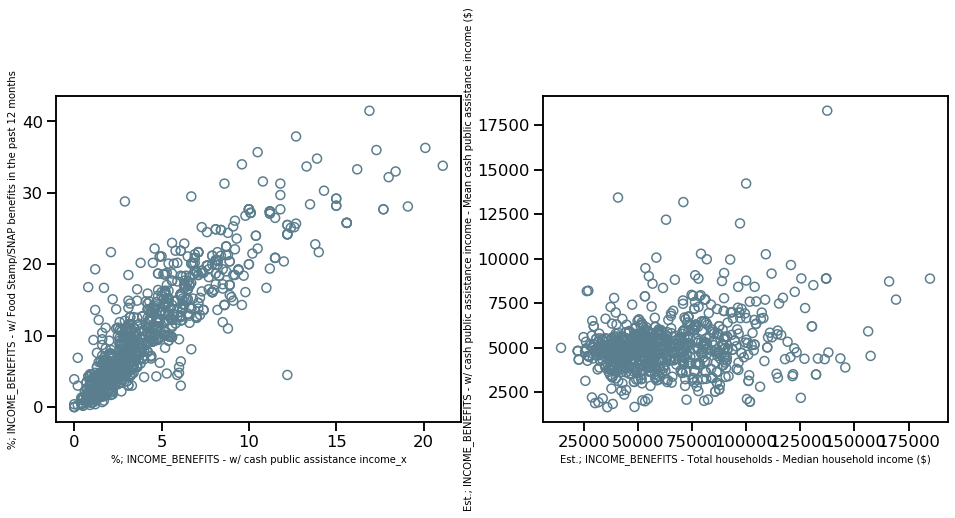

<IPython.core.display.Javascript object>

In [652]:
# Scatter plots
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(df_state_info_gs_census, 
                          '%; INCOME_BENEFITS - w/ cash public assistance income_x', 
                          '%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months', 
                          ax1)

scatter_plot_open_circles(df_state_info_gs_census, 
                          'Est.; INCOME_BENEFITS - Total households - Median household income ($)',
                          'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)', 
                          ax2)

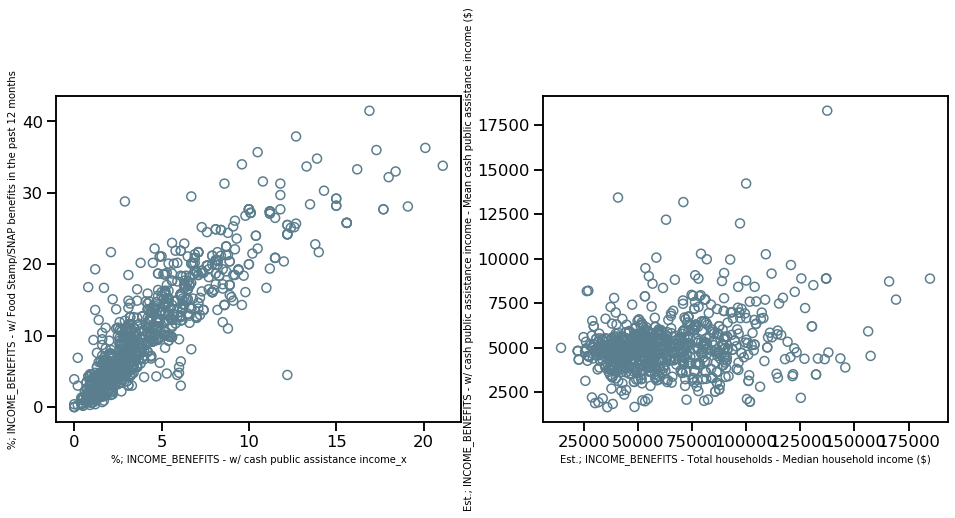

<IPython.core.display.Javascript object>

In [653]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; INCOME_BENEFITS - w/ cash public assistance income_x",
    "%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months",
    ax1,
)

scatter_plot_open_circles(
    df_state_info_gs_census,
    "Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    "Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)",
    ax2,
)

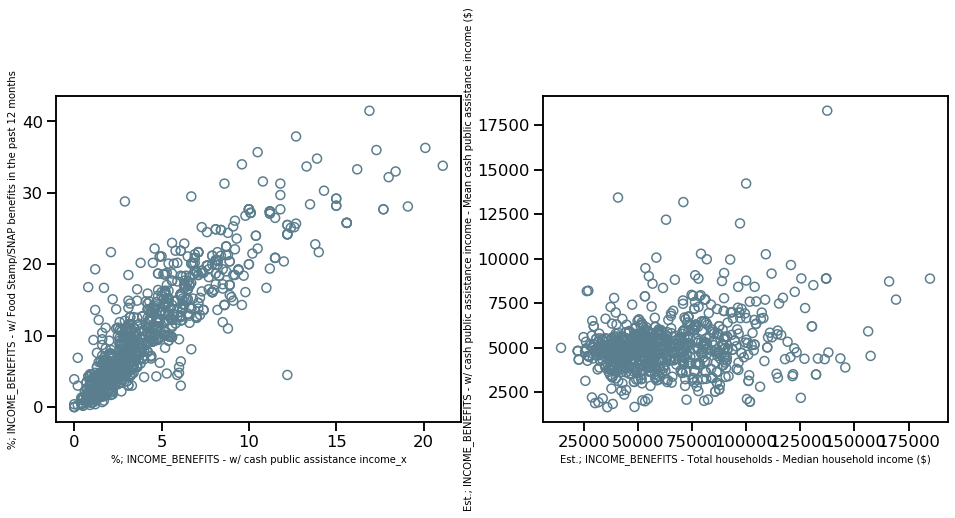

<IPython.core.display.Javascript object>

In [654]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(df_state_info_gs_census, 
                          '%; INCOME_BENEFITS - w/ cash public assistance income_x', 
                          '%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months', 
                          ax1)

scatter_plot_open_circles(df_state_info_gs_census, 
                          'Est.; INCOME_BENEFITS - Total households - Median household income ($)',
                          'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)', 
                          ax2)


### Health insurance columns

In [655]:
col_census_pct_hi = [col for col in col_census_pct if "HEALTH_INS" in col]
col_census_pct_hi

['%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - No health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ private health insurance',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - No health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage - w/ private health insurance',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE -

<IPython.core.display.Javascript object>

In [656]:
col_census_pct_hi_simplenames, col_census_pct_hi_simplenames_dict = create_simple_names('%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. ', col_census_pct_hi)
col_census_pct_hi_simplenames

['- No health ins coverage',
 '- w/ health ins coverage',
 '- w/ health ins coverage - w/ private health insurance',
 '- w/ health ins coverage - w/ public coverage',
 '18-64 yrs - In labor force: - Employed: - No health ins coverage',
 '18-64 yrs - In labor force: - Employed: - w/ health ins coverage',
 '18-64 yrs - In labor force: - Employed: - w/ health ins coverage - w/ private health insurance',
 '18-64 yrs - In labor force: - Employed: - w/ health ins coverage - w/ public coverage',
 '18-64 yrs - In labor force: - Unemployed: - No health ins coverage',
 '18-64 yrs - In labor force: - Unemployed: - w/ health ins coverage',
 '18-64 yrs - In labor force: - Unemployed: - w/ health ins coverage - w/ private health insurance',
 '18-64 yrs - In labor force: - Unemployed: - w/ health ins coverage - w/ public coverage',
 '18-64 yrs - Not in labor force: - No health ins coverage',
 '18-64 yrs - Not in labor force: - w/ health ins coverage',
 '18-64 yrs - Not in labor force: - w/ health ins

<IPython.core.display.Javascript object>

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


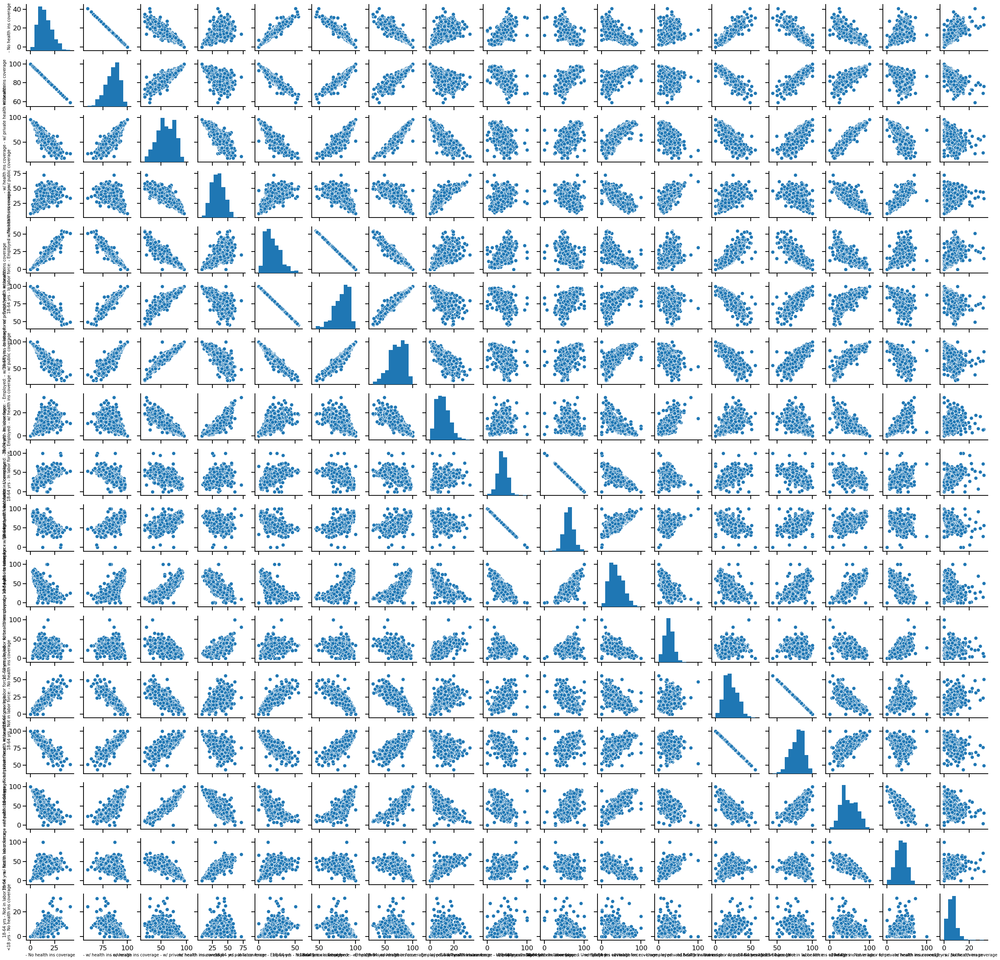

<IPython.core.display.Javascript object>

In [701]:
pairplot_w_simplenames(col_census_pct_hi, '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. ')

In [702]:
df_state_info_gs_census[col_census_pct_hi].median(axis=0).sort_values()

%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage                                                                     6.30
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage - w/ public coverage               10.20
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - No health ins coverage                                                                            14.20
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - No health ins coverage                                    17.25
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - Not in labor force: - No health ins coverage                                            20.30
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - w/ health ins coverage - w/ public coverage             26.00
%; H

<IPython.core.display.Javascript object>

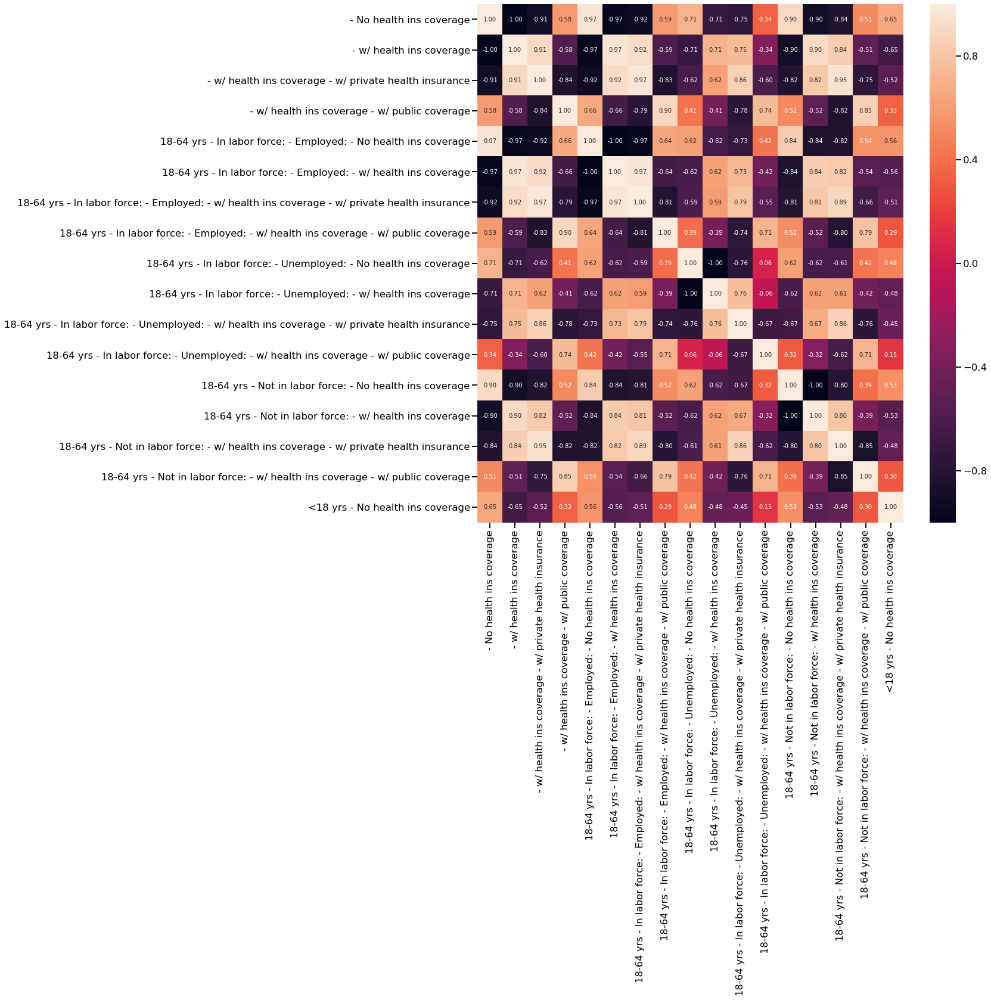

<IPython.core.display.Javascript object>

In [657]:
fig, ax = plt.subplots(figsize=(16, 16))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_hi].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

ax.set_xticklabels(col_census_pct_hi_simplenames)
ax.set_yticklabels(col_census_pct_hi_simplenames);

In [703]:
df_state_info_gs_census[col_census_pct_hi].corr(method="pearson")

,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - No health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ private health insurance,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - No health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage - w/ private health insurance,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage - w/ public coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - No health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - w/ health ins coverage - w/ private health insurance,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - w/ health ins coverage - w/ public coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - Not in labor force: - No health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - Not in labor force: - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - Not in labor force: - w/ health ins coverage - w/ private health insurance,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - Not in labor force: - w/ health ins coverage - w/ public coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - No health ins coverage,1.000000,-1.000000,-0.905501,0.581482,0.966324,-0.966324,-0.923732,0.590855,0.707859,-0.707866,-0.746065,0.341638,0.902922,-0.902921,-0.836455,0.512362,0.653922
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,-1.000000,1.000000,0.905501,-0.581482,-0.966324,0.966324,0.923732,-0.590855,-0.707859,0.707866,0.746065,-0.341638,-0.902922,0.902921,0.836455,-0.512362,-0.653922
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ private health insurance,-0.905501,0.905501,1.000000,-0.837602,-0.919000,0.919000,0.970527,-0.833666,-0.624320,0.624341,0.856043,-0.602929,-0.822606,0.822610,0.946785,-0.748324,-0.522262
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,0.581482,-0.581482,-0.837602,1.000000,0.658288,-0.658288,-0.787868,0.896270,0.406643,-0.406676,-0.779443,0.742197,0.515167,-0.515166,-0.822581,0.847335,0.331349
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - No health ins coverage,0.966324,-0.966324,-0.919000,0.658288,1.000000,-1.000000,-0.966100,0.644803,0.620292,-0.620303,-0.729993,0.416200,0.841507,-0.841503,-0.823795,0.542841,0.557392
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage,-0.966324,0.966324,0.919000,-0.658288,-1.000000,1.000000,0.966100,-0.644803,-0.620292,0.620303,0.729993,-0.416200,-0.841507,0.841503,0.823795,-0.542841,-0.557392
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage - w/ private health insurance,-0.923732,0.923732,0.970527,-0.787868,-0.966100,0.966100,1.000000,-0.813890,-0.594801,0.594818,0.794751,-0.545714,-0.8115

<IPython.core.display.Javascript object>

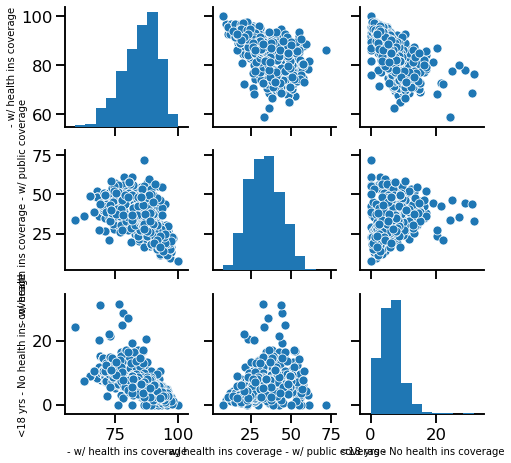

<IPython.core.display.Javascript object>

In [704]:
# Iteration 1 - hand select other columns to account for correlations anti-correlations, etc.

col_census_pct_hi_v0 = [
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage",
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage",
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage",
]


col_census_pct_hi_v0_simplenames, col_census_pct_hi_v0_simplenames_dict = create_simple_names('%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. ', col_census_pct_hi_v0)

pairplot_w_simplenames(col_census_pct_hi_v0, '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. ')



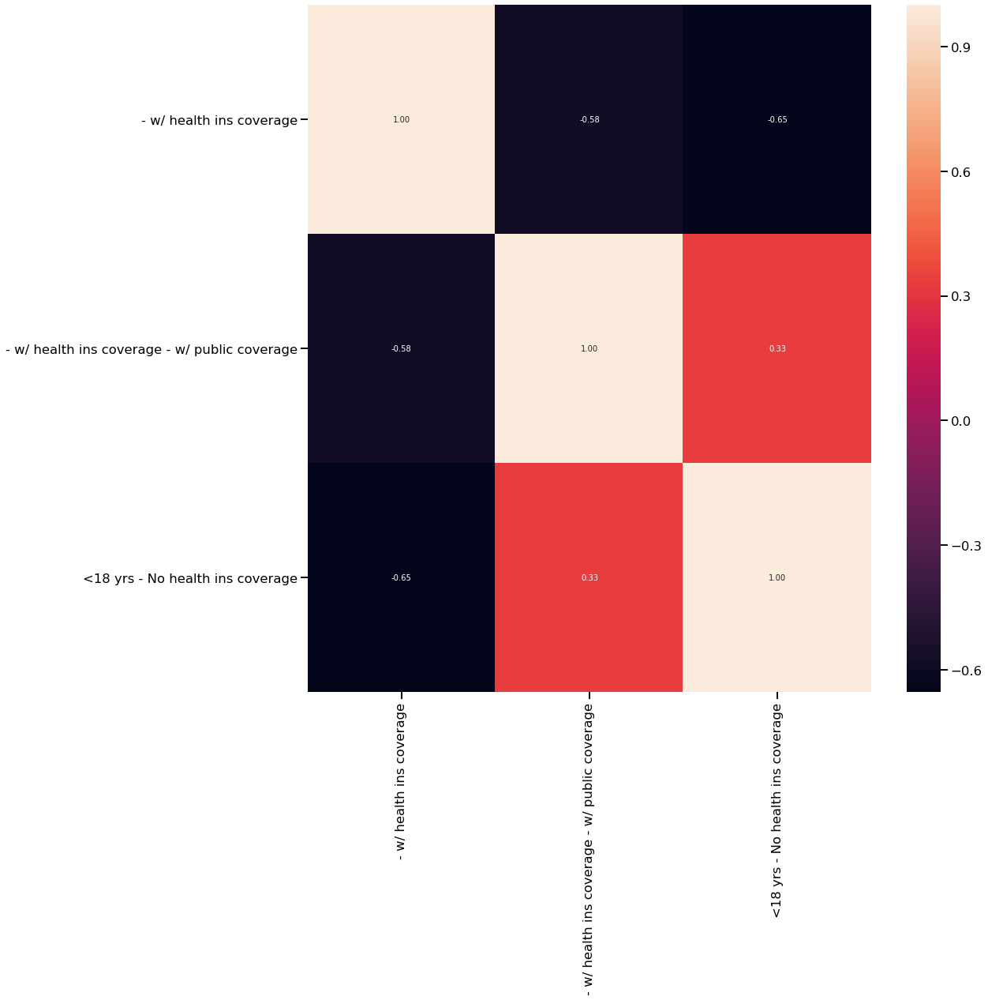

<IPython.core.display.Javascript object>

In [708]:
fig, ax = plt.subplots(figsize=(16, 16))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_hi_v0].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

ax.set_xticklabels(col_census_pct_hi_v0_simplenames)
ax.set_yticklabels(col_census_pct_hi_v0_simplenames);

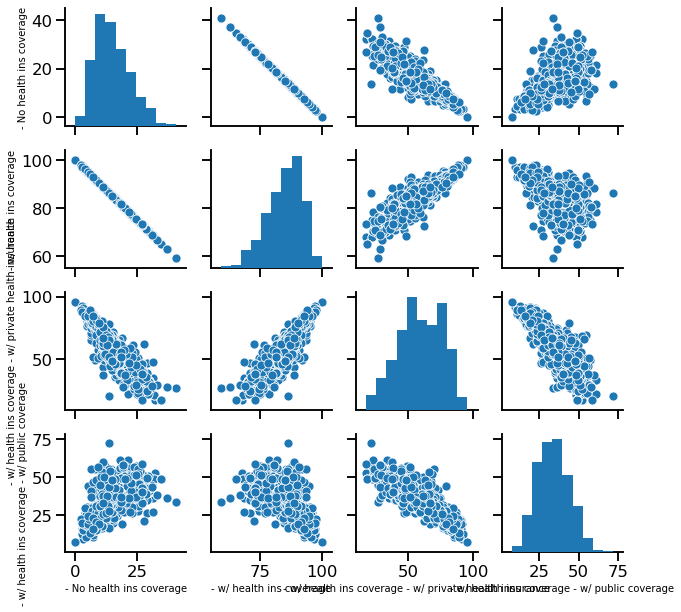

<IPython.core.display.Javascript object>

In [707]:
# Iteration 2 - select columns that are interesting, simple, etc.

col_census_pct_hi_v1 = [
'%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - No health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ private health insurance',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage',
]


col_census_pct_hi_v1_simplenames, col_census_pct_hi_v1_simplenames_dict = create_simple_names('%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. ', col_census_pct_hi_v1)

pairplot_w_simplenames(col_census_pct_hi_v1, '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. ')


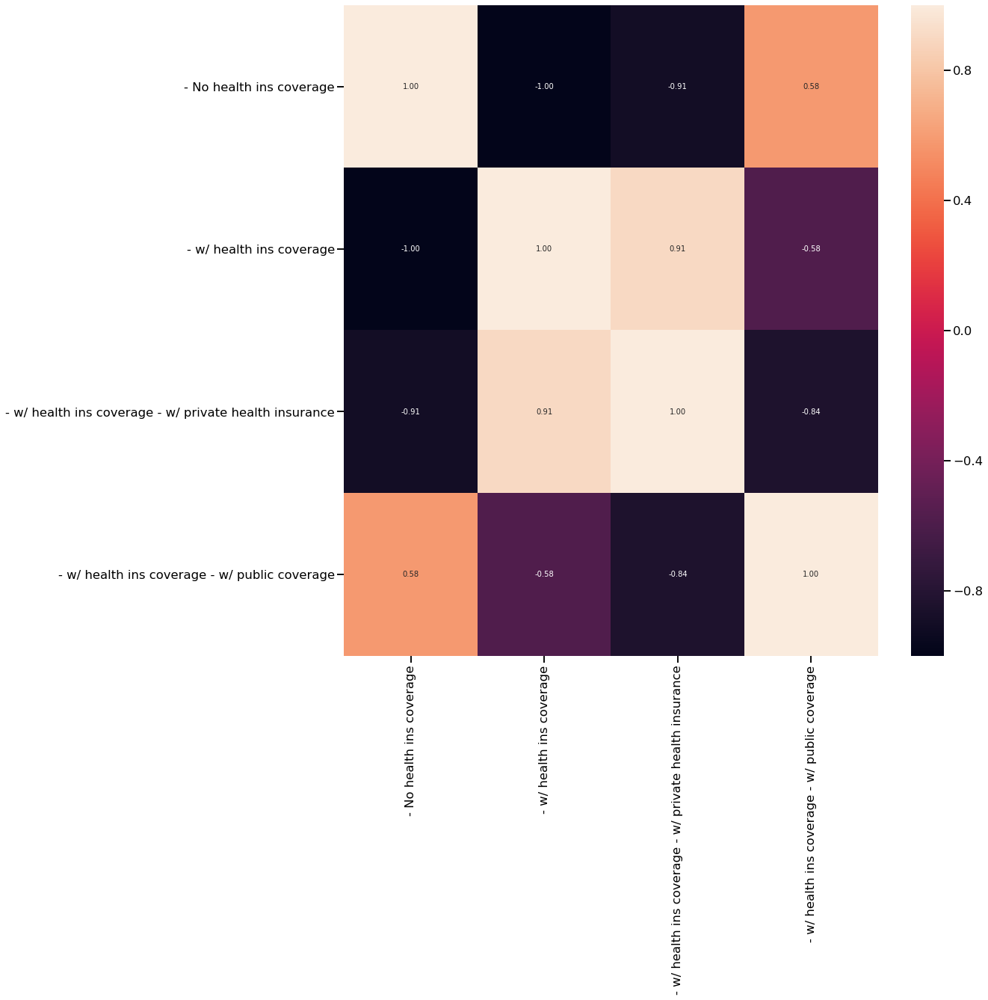

<IPython.core.display.Javascript object>

In [709]:
fig, ax = plt.subplots(figsize=(16, 16))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_hi_v1].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

ax.set_xticklabels(col_census_pct_hi_v1_simplenames)
ax.set_yticklabels(col_census_pct_hi_v1_simplenames);

#### Set final health insurance columns

**The first set of health insurance columns had fewer correlations.**

In [710]:
col_census_pct_hi_final = col_census_pct_hi_v0.copy()
col_census_pct_hi_final

['%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage']

<IPython.core.display.Javascript object>

### Work commute columns

In [711]:
col_census_pct_wc = [col for col in col_census_pct if "WORK_COMMUTE" in col]
col_census_pct_wc

['%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Other means',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Walked',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home']

<IPython.core.display.Javascript object>

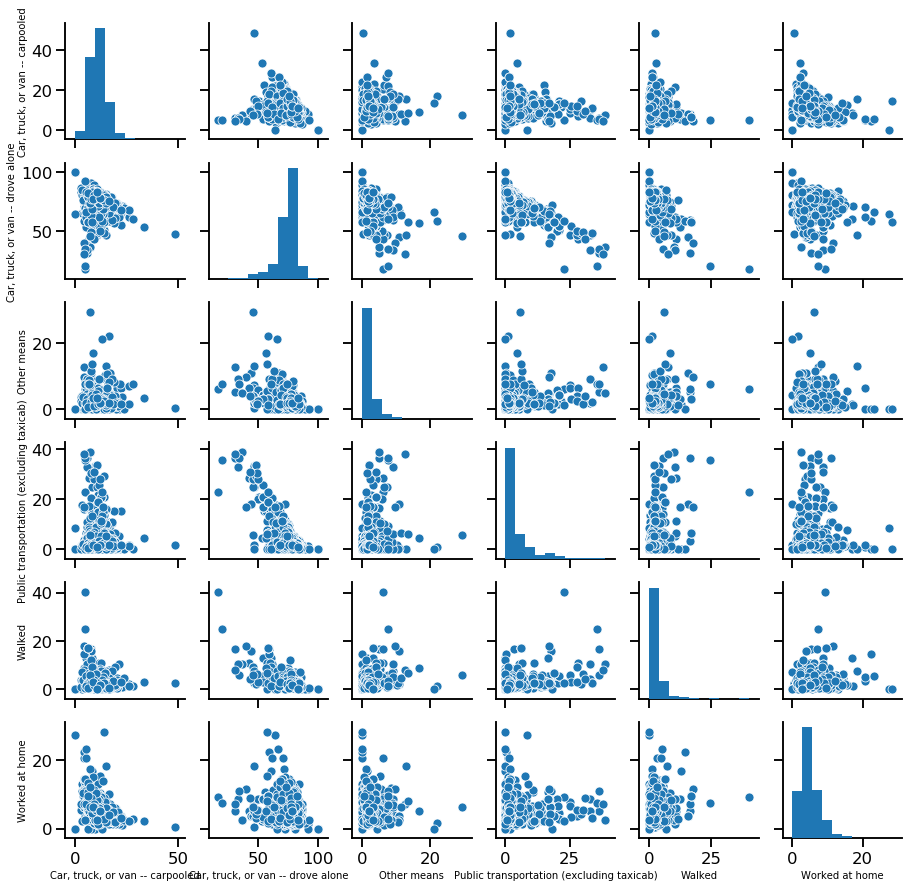

<IPython.core.display.Javascript object>

In [712]:
pairplot_w_simplenames(col_census_pct_wc, '%; WORK_COMMUTE - Workers 16 yrs and up - ')

In [713]:
df_state_info_gs_census[col_census_pct_wc].corr(method="pearson")

,"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled","%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",%; WORK_COMMUTE - Workers 16 yrs and up - Other means,%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab),%; WORK_COMMUTE - Workers 16 yrs and up - Walked,%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home
"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled",1.000000,-0.164392,-0.065099,-0.098678,-0.166163,-0.437000
"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",-0.164392,1.000000,-0.490504,-0.796416,-0.648986,-0.164221
%; WORK_COMMUTE - Workers 16 yrs and up - Other means,-0.065099,-0.490504,1.000000,0.230473,0.352367,0.009150
%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab),-0.098678,-0.796416,0.230473,1.000000,0.374970,-0.057878
%; WORK_COMMUTE - Workers 16 yrs and up - Walked,-0.166163,-0.648986,0.352367,0.374970,1.000000,0.192866
%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home,-0.437000,-0.164221,0.009150,-0.057878,0.192866,1.000000


<IPython.core.display.Javascript object>

In [714]:
col_census_pct_wc_simplenames, col_census_pct_wc_simplenames_dict = create_simple_names('%; WORK_COMMUTE - Workers 16 yrs and up - ', col_census_pct_wc)
col_census_pct_wc_simplenames

['Car, truck, or van -- carpooled',
 'Car, truck, or van -- drove alone',
 'Other means',
 'Public transportation (excluding taxicab)',
 'Walked',
 'Worked at home']

<IPython.core.display.Javascript object>

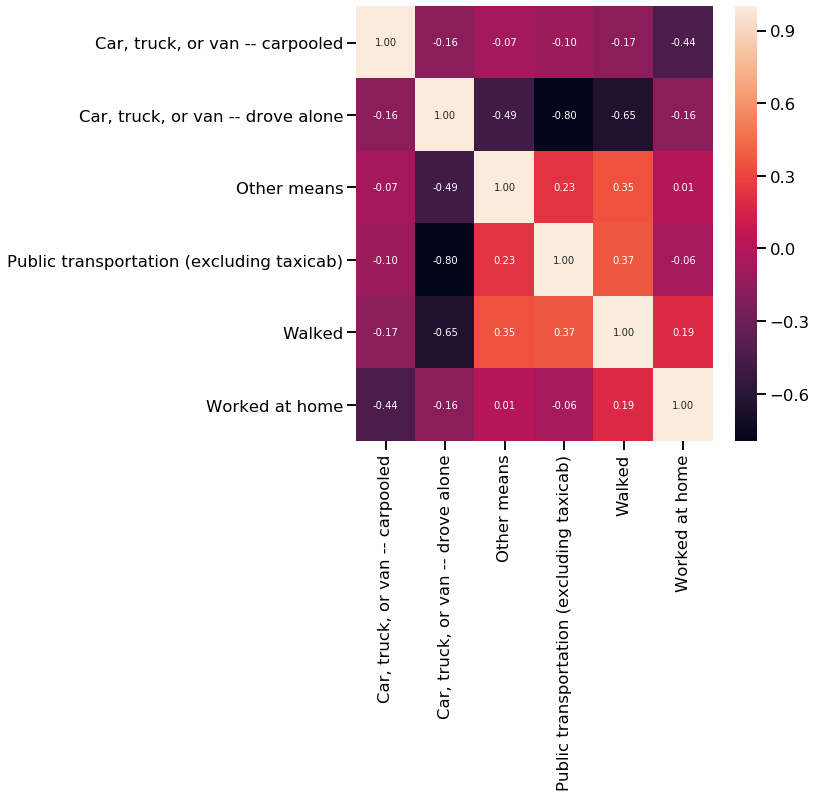

<IPython.core.display.Javascript object>

In [715]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_wc].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

ax.set_xticklabels(col_census_pct_wc_simplenames)
ax.set_yticklabels(col_census_pct_wc_simplenames);

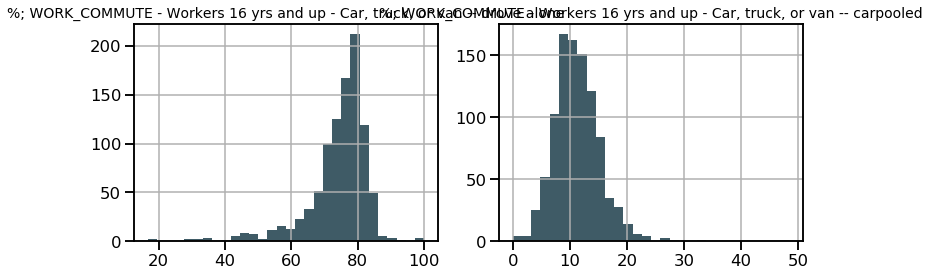

<IPython.core.display.Javascript object>

In [673]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled",
    ax2,
)

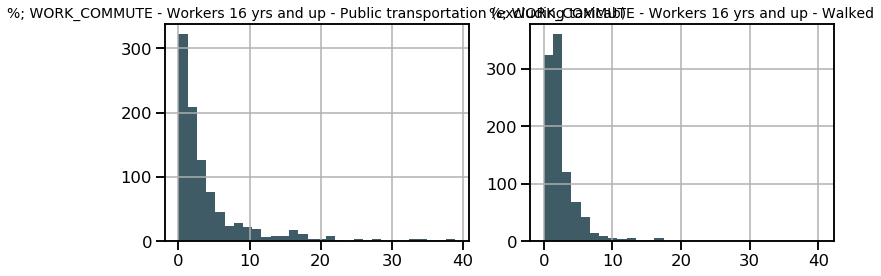

<IPython.core.display.Javascript object>

In [674]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    ax1,
)

hist_plot(
    df_state_info_gs_census, "%; WORK_COMMUTE - Workers 16 yrs and up - Walked", ax2,
)

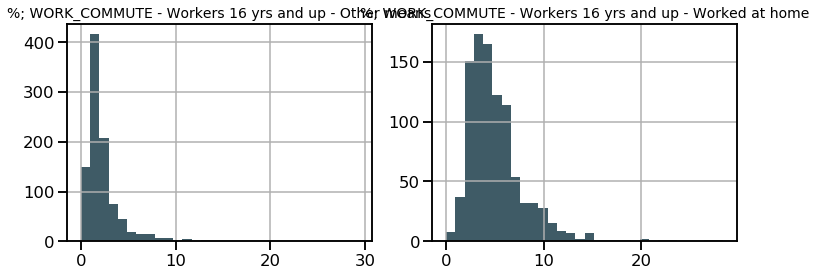

<IPython.core.display.Javascript object>

In [675]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Other means",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home",
    ax2,
)

**The Pearson is -.0.80 between "drove alone" and "public transportation". It's borderline, but I'll keep both. I will drop "other."**

In [717]:
# Chose these since they had a more normal distribution and minimized correlations/anti-correlations
col_census_pct_wc_final = [
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Walked",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home",
]

<IPython.core.display.Javascript object>

### Occupation and industry columns

#### Occupation

In [718]:
col_census_pct_occ = [col for col in col_census_pct if "OCCUPATION" in col]
col_census_pct_occ

['%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations']

<IPython.core.display.Javascript object>

In [719]:
col_census_pct_occ_simplenames, col_census_pct_occ_simplenames_dict = create_simple_names('%; OCCUPATION - Civilian employed pop. 16 yrs and up - ', col_census_pct_occ)

<IPython.core.display.Javascript object>

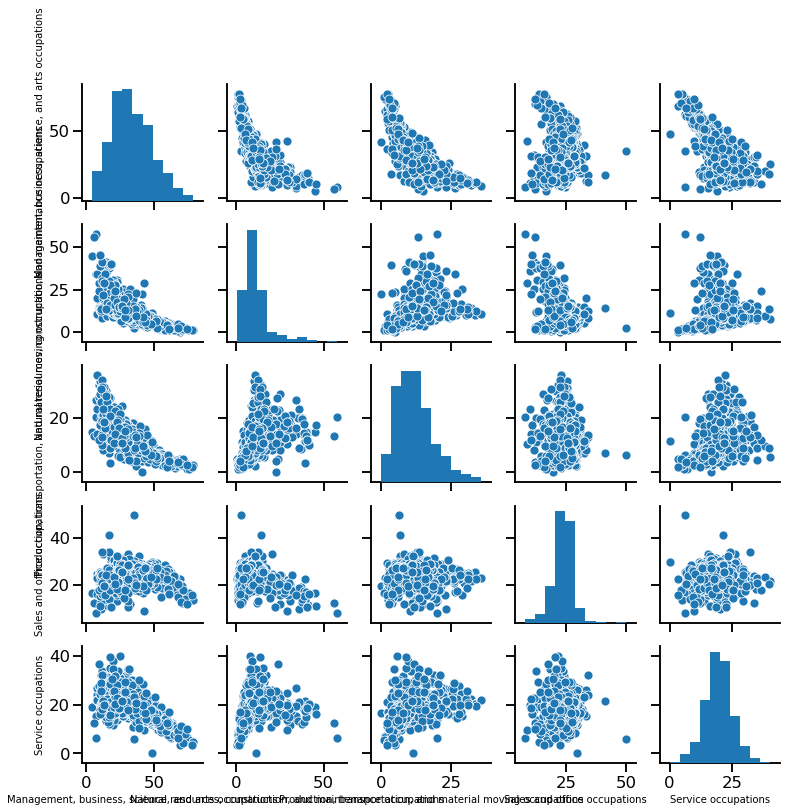

<IPython.core.display.Javascript object>

In [720]:
pairplot_w_simplenames(col_census_pct_occ, '%; OCCUPATION - Civilian employed pop. 16 yrs and up - ')

In [721]:
df_state_info_gs_census[col_census_pct_occ].corr(method="pearson")

,"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations","%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations","%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations",%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations,%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations",1.000000,-0.661820,-0.813368,-0.083980,-0.674378
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations",-0.661820,1.000000,0.393881,-0.410011,0.203944
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations",-0.813368,0.393881,1.000000,0.020743,0.374049
%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations,-0.083980,-0.410011,0.020743,1.000000,0.026963
%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations,-0.674378,0.203944,0.374049,0.026963,1.000000


<IPython.core.display.Javascript object>

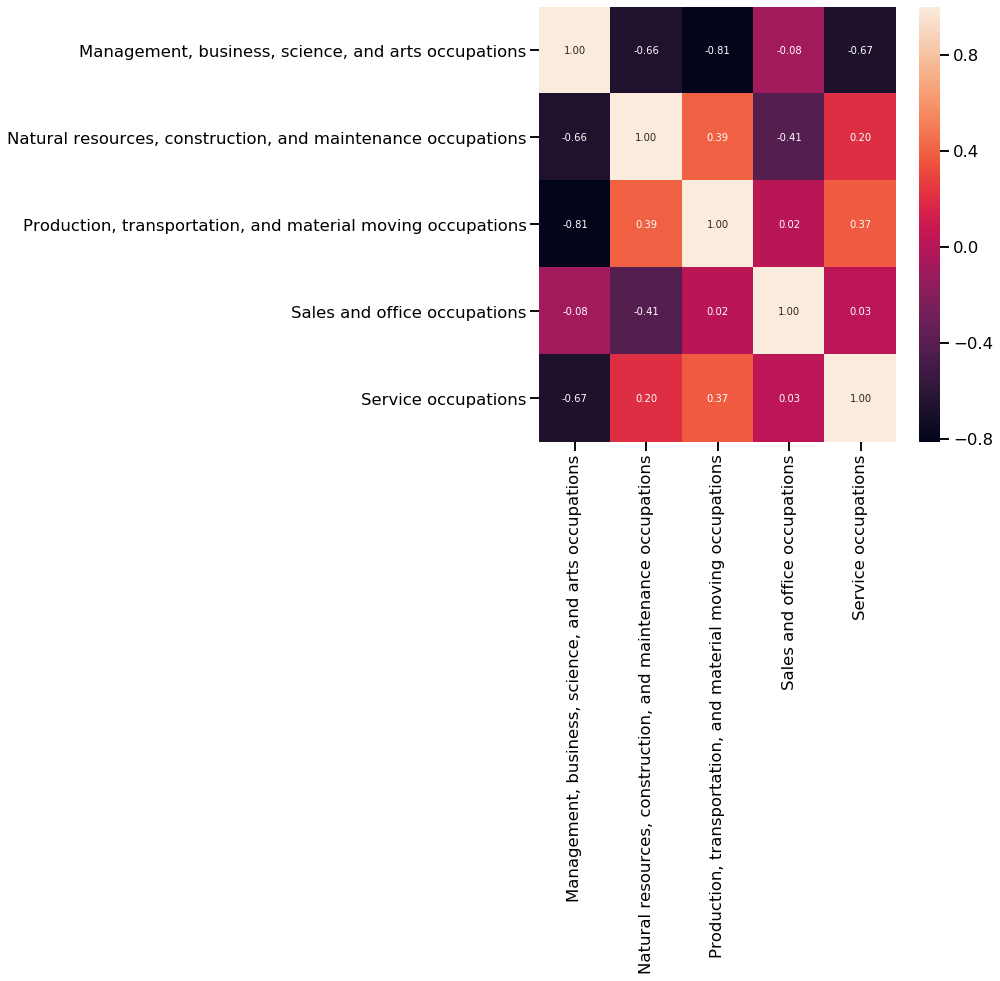

<IPython.core.display.Javascript object>

In [722]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_occ].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

ax.set_xticklabels(col_census_pct_occ_simplenames)
ax.set_yticklabels(col_census_pct_occ_simplenames);

#### Industry

In [723]:
col_census_pct_industry = [col for col in col_census_pct if "INDUSTRY" in col]
col_census_pct_industry

['%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Arts, entertainment, and recreation, and accommodation and food services',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public 

<IPython.core.display.Javascript object>

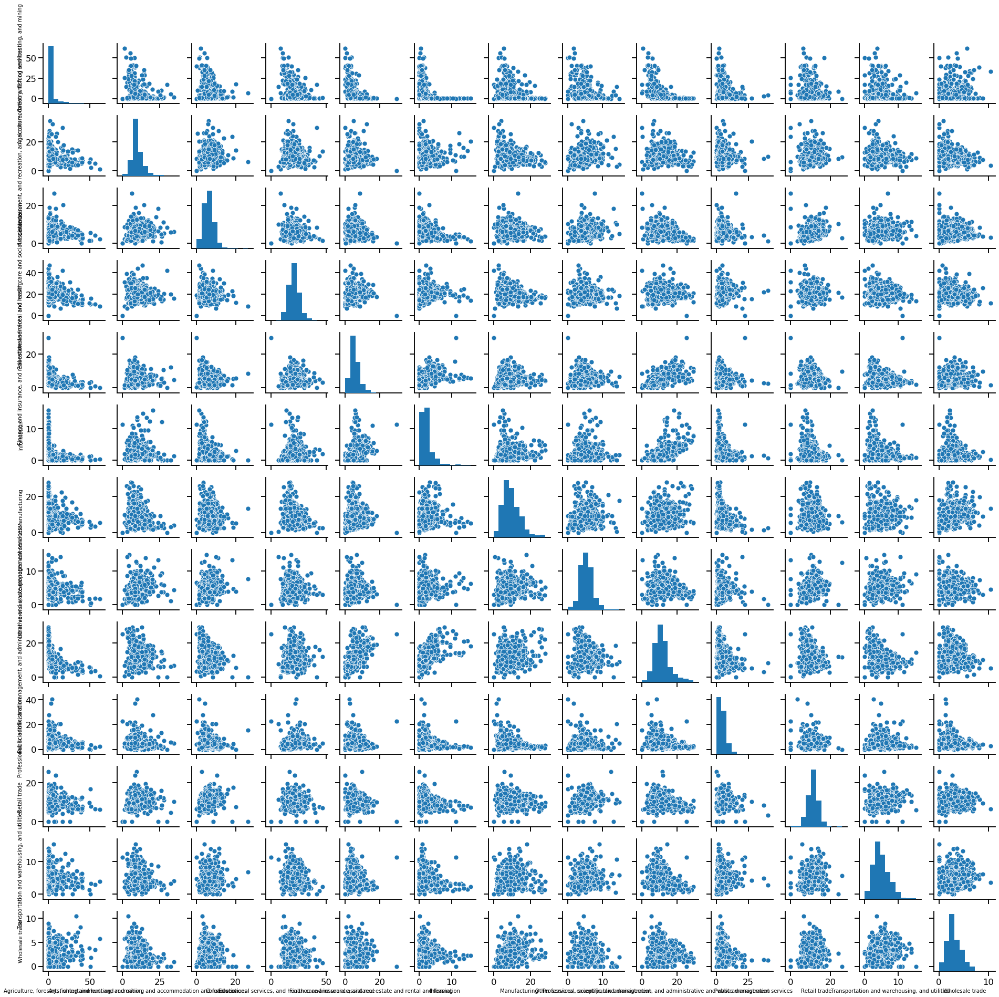

<IPython.core.display.Javascript object>

In [724]:
industry_simple_names, industry_simple_names_dict = create_simple_names('%; INDUSTRY - Civilian employed pop. 16 yrs and up - ', col_census_pct_industry)

pairplot_w_simplenames(col_census_pct_industry, '%; INDUSTRY - Civilian employed pop. 16 yrs and up - ')


In [725]:
df_state_info_gs_census[col_census_pct_industry].median(axis=0).sort_values()

%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining                                         0.8
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information                                                                                    1.9
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade                                                                                2.9
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration                                                                          4.1
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities                                                  4.6
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing                                  5.3
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public admin

<IPython.core.display.Javascript object>

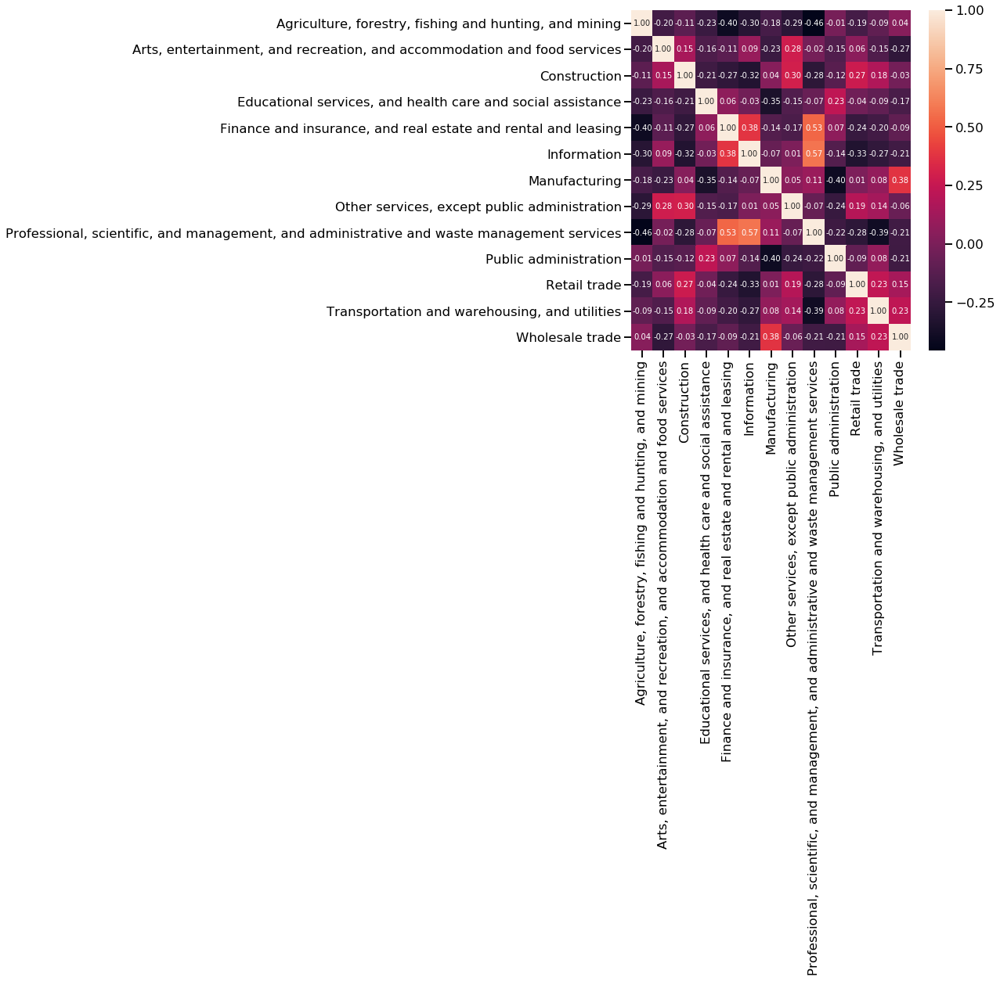

<IPython.core.display.Javascript object>

In [726]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_industry].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

ax.set_xticklabels(industry_simple_names)
ax.set_yticklabels(industry_simple_names);

### Look at correlations between both

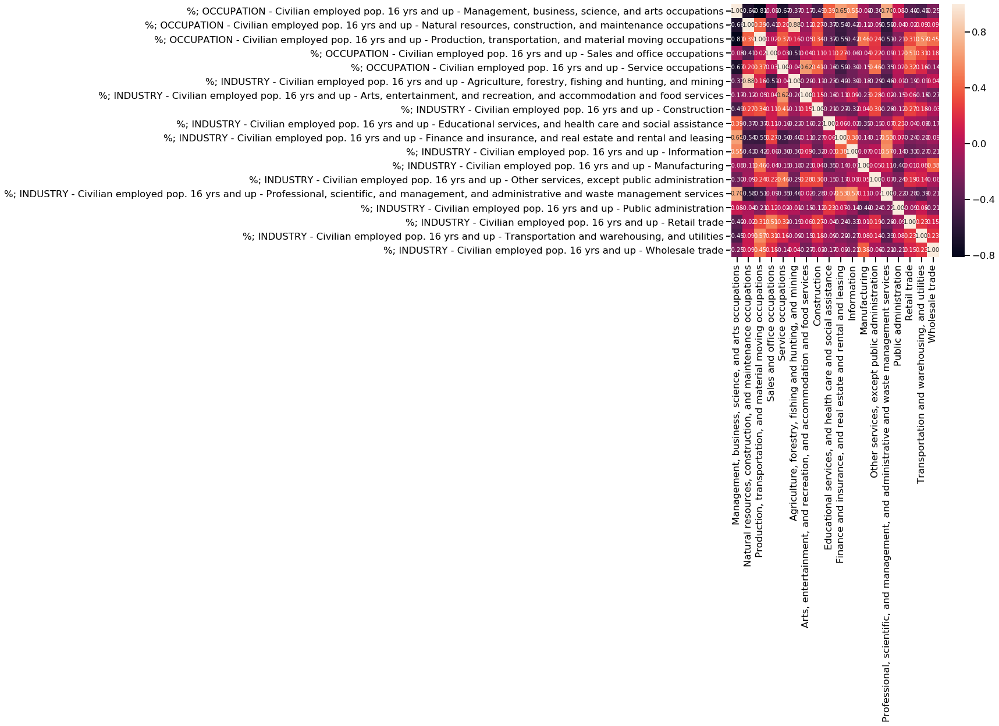

<IPython.core.display.Javascript object>

In [727]:
# Occupational and industry columns
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_occ + col_census_pct_industry].corr(
        method="pearson"
    ),
    annot=True,
    fmt="0.2f",
)

ax.set_xticklabels(col_census_pct_occ_simplenames + industry_simple_names);

In [728]:
df_state_info_gs_census[col_census_pct_occ + col_census_pct_industry].corr(
    method="pearson"
)

,"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations","%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations","%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations",%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations,%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Arts, entertainment, and recreation, and accommodation and food services",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations",1.000000,-0.661820,-0.813368,-0.083980,-0.674378,-0.366288,-0.165185,-0.485156,0.390734,0.646317,0.551204,-0.084972,-0.303397,0.696205,0.076246,-0.398131,-0.453053,-0.245334
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations",-0.661820,1.000000,0.393881,-0.410011,0.203944,0.878776,-0.122818,0.271490,-0.365248,-0.535600,-0.431948,-0.108359,-0.089228,-0.584620,-0.040086,-0.017143,0.087785,0.088404
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations",-0.813368,0.393881,1.000000,0.020743,0.374049,0.156381,-0.051165,0.338470,-0.373068,-0.549527,-0.421412,0.456578,0.239246,-0.507645,-0.207804,0.306320,0.567351,0.445098
%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations,-0.083980,-0.410011,0.020743,1.000000,0.026963,-0.513384,0.038543,0.106225,0.106615,0.273431,-0.062868,-0.037684,0.215711,-0.094122,0.116927,0.513432,0.309677,0.184092
%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations,-0.674378,0.203944,0.374049,0.026963,1.000000,-0.041542,0.618185,0.412865,-0.157290,-0.496012,-0.302832,-0.149813,0.461312,-0.349887,0.019185,0.320889,0.159612,-0.141109
"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining",-0.366288,0.878776,0.156381,-0.513384,-0.041542,1.000000,-0.199976,-0.105494,-0.233337,-0.401250,-0.302875,-0.182593,-0.285979,-0.455482,-0.014628,-0.192404,-0.093655,0.044524
"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Arts, entertainment, and recreation, and accommodation and food services",-0.165185,-0.122818,-0.051165,0.038543,0.618185,-0.199976,1.000000,0.151612,-0.156681,-0.109985,0.094890,-0.228735,0.284656,-0.019058,-0.148195,0.055670,-0.152502,-0.271164
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction,-0.485156,0.271490,0.338470,0.106225,0.412865,-0.105494,0.151612,1.000000,-0.212402,-0.270945,-0.322606,0.038339,0.296168,-0.282096,-0.123485,0.273488,0.176399,-0.027158
"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care

<IPython.core.display.Javascript object>

**An argument can be made that I should keep industry but drop occupation. The former is more variable and has fewer correlations/anti-correlations. But here I'll evaluate having both the industry columns and the occupation columns.**

In [729]:
col_census_pct_industry_final = col_census_pct_industry.copy()

# Saw in VIF evaluation that this category was high
col_census_pct_industry_final.remove('%; INDUSTRY - Civilian employed pop. 16 yrs and up - Arts, entertainment, and recreation, and accommodation and food services')

<IPython.core.display.Javascript object>

In [730]:
col_census_pct_industry_final

['%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade',
 '%; INDUSTRY - Civilian employed pop. 16 y

<IPython.core.display.Javascript object>

**Occupational categories have the benefit of being simpler. I'll look at this but drop categories that have high correlation/VIF.**

In [731]:
col_census_pct_occ_final = col_census_pct_occ.copy()
col_census_pct_occ_final.remove('%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations')
col_census_pct_occ_final.remove('%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations')

<IPython.core.display.Javascript object>

In [732]:
col_census_pct_occ_final

['%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations']

<IPython.core.display.Javascript object>

### Worker class columns

In [733]:
col_census_pct_workerclass = [col for col in col_census_pct if "WORKER_CLASS" in col]

df_state_info_gs_census[col_census_pct_workerclass].corr(method="pearson")

,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Government workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Unpaid family workers
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Government workers,1.000000,-0.877237,-0.152587,0.111568
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers,-0.877237,1.000000,-0.339190,-0.181703
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers,-0.152587,-0.339190,1.000000,0.082929
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Unpaid family workers,0.111568,-0.181703,0.082929,1.000000


<IPython.core.display.Javascript object>

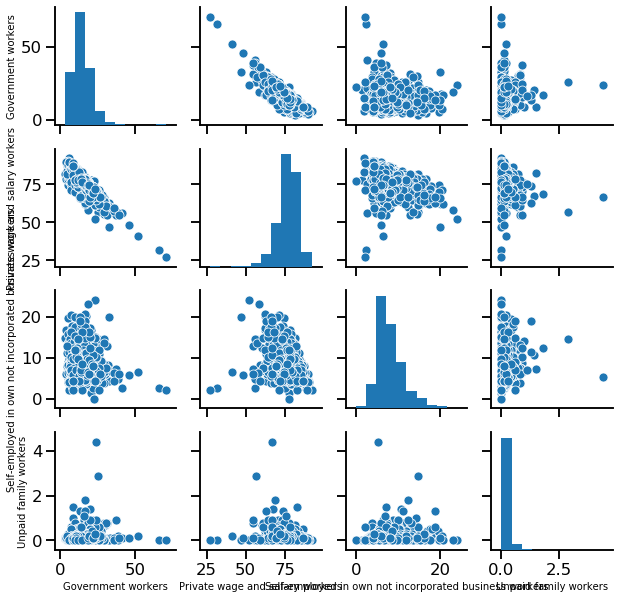

<IPython.core.display.Javascript object>

In [734]:
col_census_pct_workerclass_simplenames, col_census_pct_workerclass_simplenames_dict = create_simple_names('%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - ', col_census_pct_workerclass)

pairplot_w_simplenames(col_census_pct_workerclass, '%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - ')


In [735]:
 df_state_info_gs_census[col_census_pct_workerclass].median(axis=0).sort_values()

%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Unpaid family workers                                      0.10
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers     7.50
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Government workers                                        13.75
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers                           77.70
dtype: float64

<IPython.core.display.Javascript object>

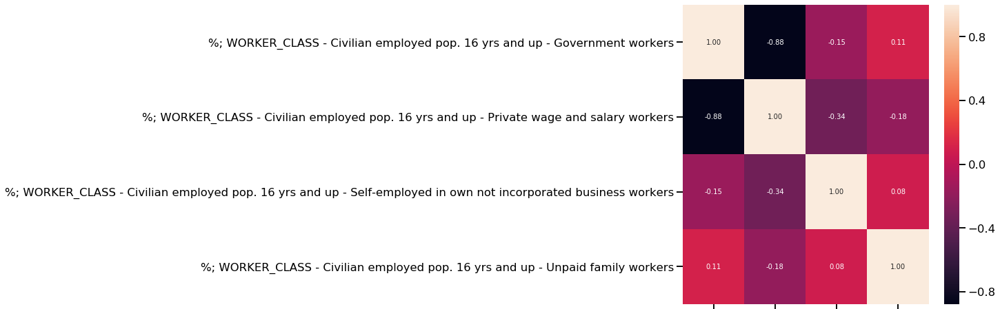

<IPython.core.display.Javascript object>

In [736]:
# Worker class columns
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_workerclass].corr(
        method="pearson"
    ),
    annot=True,
    fmt="0.2f",
)

#ax.set_xticklabels(col_census_pct_workerclass_simplenames);
ax.set_xticklabels('');

**Drop government workers since they're highly correlated with private wage and salary workers. Also drop Unpaid family workers since they're pretty rare.**

In [737]:
col_census_pct_workerclass_final = [
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers",
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers",
]

<IPython.core.display.Javascript object>

### Employment status columns

In [740]:
col_census_pct_employstatus = [col for col in col_census_pct if "EMPLOY_STATUS" in col]
col_census_pct_employstatus

['%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate',
 '%; EMPLOY_STATUS - Females 16 yrs and up - In labor force',
 '%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force',
 '%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed',
 '%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force',
 '%; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force']

<IPython.core.display.Javascript object>

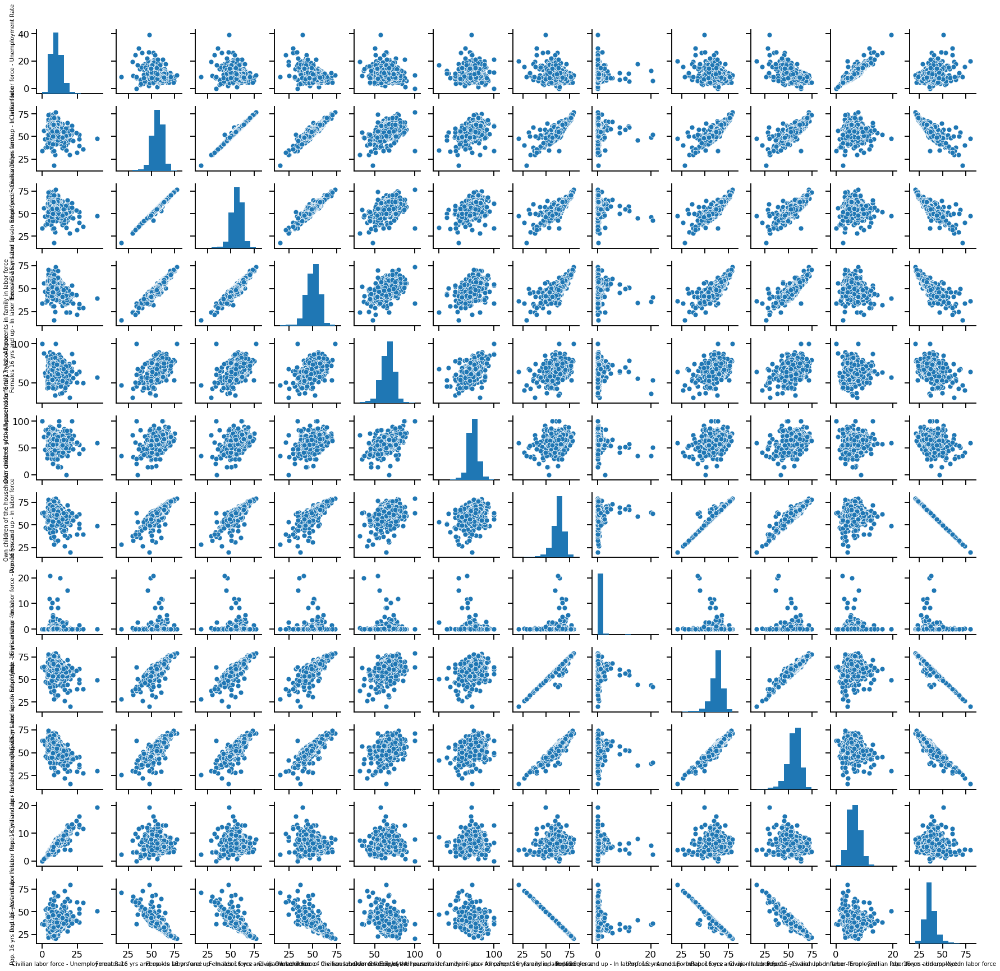

<IPython.core.display.Javascript object>

In [741]:
col_census_pct_employstatus_simplenames, col_census_pct_employstatus_simple_names_dict = create_simple_names('%; EMPLOY_STATUS - ', col_census_pct_employstatus)

pairplot_w_simplenames(col_census_pct_employstatus, '%; EMPLOY_STATUS - ')


In [744]:
df_state_info_gs_census[col_census_pct_employstatus].median(axis=0).sort_values()

%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces                                     0.00
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed                6.30
%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate                                               9.80
%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force                                               36.50
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed              50.80
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force                         56.60
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed                 56.60
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force                                                56.70
%; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force    61.70
%

<IPython.core.display.Javascript object>

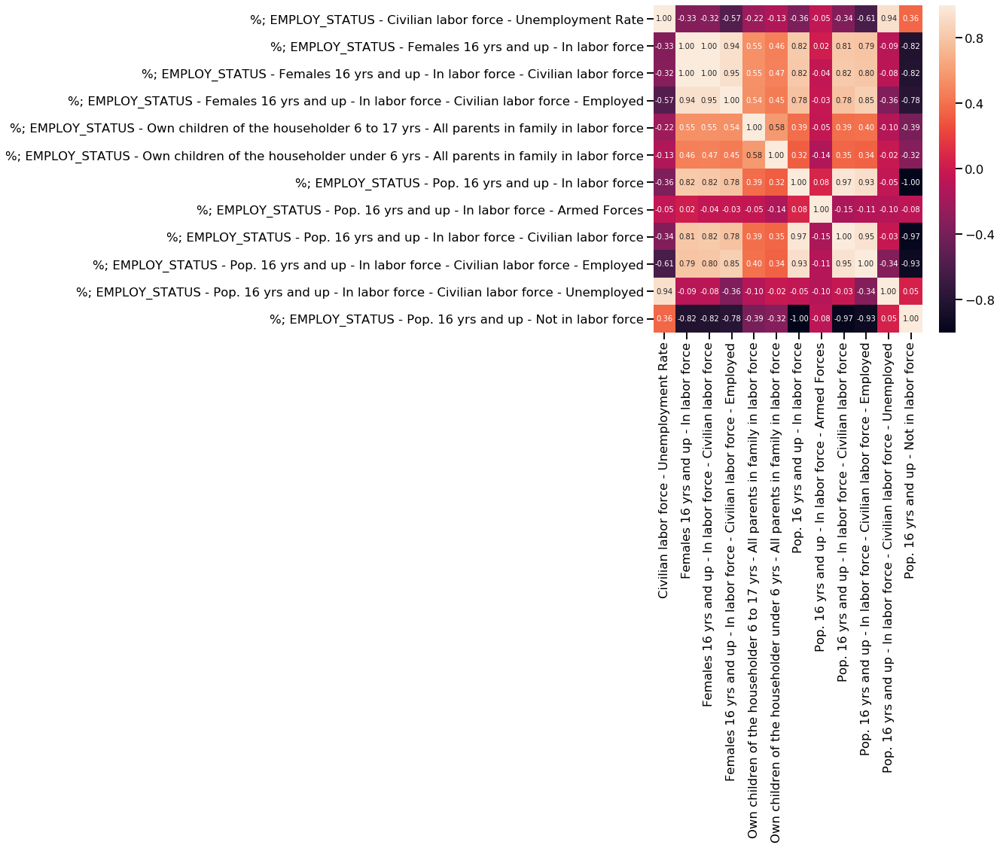

<IPython.core.display.Javascript object>

In [743]:
# Employment status columns
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_employstatus].corr(
        method="pearson"
    ),
    annot=True,
    fmt="0.2f",
)

ax.set_xticklabels(col_census_pct_employstatus_simplenames);
#ax.set_xticklabels('');

In [738]:
df_state_info_gs_census[col_census_pct_employstatus].corr(method="pearson")

,%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force,%; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force
%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,1.000000,-0.328926,-0.322421,-0.567519,-0.222267,-0.125891,-0.359959,-0.054025,-0.344712,-0.613562,0.937749,0.359959
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force,-0.328926,1.000000,0.997199,0.944545,0.545221,0.464625,0.823139,0.019791,0.811395,0.792761,-0.090603,-0.823139
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force,-0.322421,0.997199,1.000000,0.945086,0.546049,0.470404,0.818249,-0.044170,0.821197,0.799133,-0.081334,-0.818249
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,-0.567519,0.944545,0.945086,1.000000,0.537020,0.452574,0.784276,-0.030730,0.784580,0.849463,-0.356786,-0.784276
%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force,-0.222267,0.545221,0.546049,0.537020,1.000000,0.580127,0.386943,-0.046473,0.394089,0.403817,-0.104570,-0.386943
%; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force,-0.125891,0.464625,0.470404,0.452574,0.580127,1.000000,0.324231,-0.135614,0.352826,0.339703,-0.023200,-0.324231
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force,-0.359959,0.823139,0.818249,0.784276,0.386943,0.324231,1.000000,0.077332,0.973561,0.933994,-0.053218,-1.000000
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces,-0.054025,0.019791,-0.044170,-0.030730,-0.046473,-0.135614,0.077332,1.000000,-0.152381,-0.111422,-0.104238,-0.077332
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force,-0.344712,0.811395,0.821197,0.784580,0.394089,0.352826,0.973561,-0.152381,1.000000,0.951478,-0.029183,-0.973561
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed,-0.613562,0.792761,0.799133,0.849463,0.403817,0.339703,0.933994,-0.111422,0.951478,1.000000,-0.335273,-0.933994


<IPython.core.display.Javascript object>

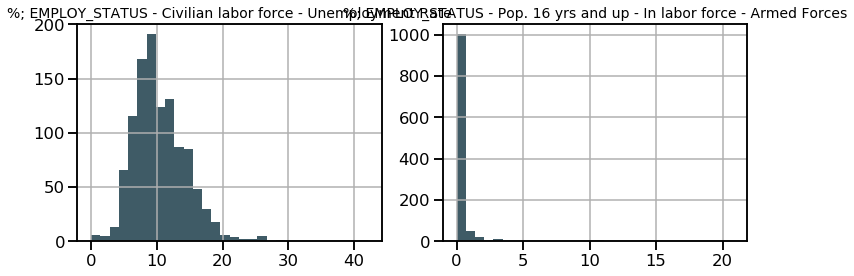

<IPython.core.display.Javascript object>

In [162]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces",
    ax2,
)

In [171]:
df_state_info_gs_census["%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces"].sort_values().tail(50)

776      1.4
165      1.5
164      1.5
1        1.5
166      1.5
790      1.5
732      1.6
155      1.6
811      1.6
814      1.7
490      1.8
634      1.9
993      2.0
992      2.0
750      2.1
1106     2.2
754      2.2
809      2.2
1107     2.6
1108     2.6
733      2.7
980      2.7
773      3.0
775      3.0
774      3.0
772      3.0
795      3.1
796      3.1
797      3.1
805      3.4
804      3.4
480      3.4
807      3.6
780      4.0
489      4.0
815      4.8
481      5.3
782      5.5
781      8.3
808      8.3
771     10.4
768     10.4
769     10.4
770     10.4
167     11.6
168     11.6
488     11.8
706     15.1
157     20.0
743     20.8
Name: %; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces, dtype: float64

<IPython.core.display.Javascript object>

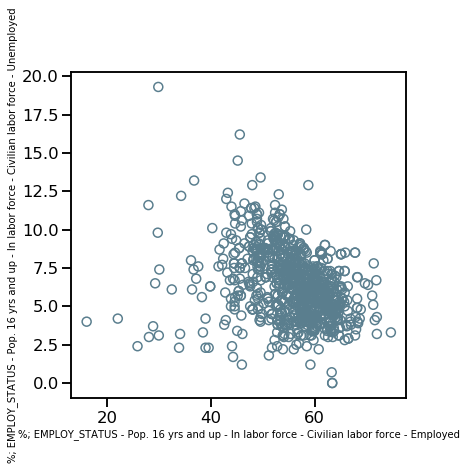

<IPython.core.display.Javascript object>

In [745]:
# Note - I don't entirely understand why
# "In labor force - Civilian labor force - Employed and Civilian labor force" and "Unemployment Rate" are not anti-correlated
# I'll keep only the latter

f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed",
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed",
    ax1,
)

In [746]:
col_census_pct_employstatus_final = [
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force",
    "%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate",
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces",
    "%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed",
    "%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force",
]

<IPython.core.display.Javascript object>

In [748]:
df_state_info_gs_census[col_census_pct_employstatus_final].corr(method="pearson")

,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force
%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,1.000000,0.359959,-0.077332,-0.784276,-0.386943
%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,0.359959,1.000000,-0.054025,-0.567519,-0.222267
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces,-0.077332,-0.054025,1.000000,-0.030730,-0.046473
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,-0.784276,-0.567519,-0.030730,1.000000,0.537020
%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force,-0.386943,-0.222267,-0.046473,0.537020,1.000000


<IPython.core.display.Javascript object>

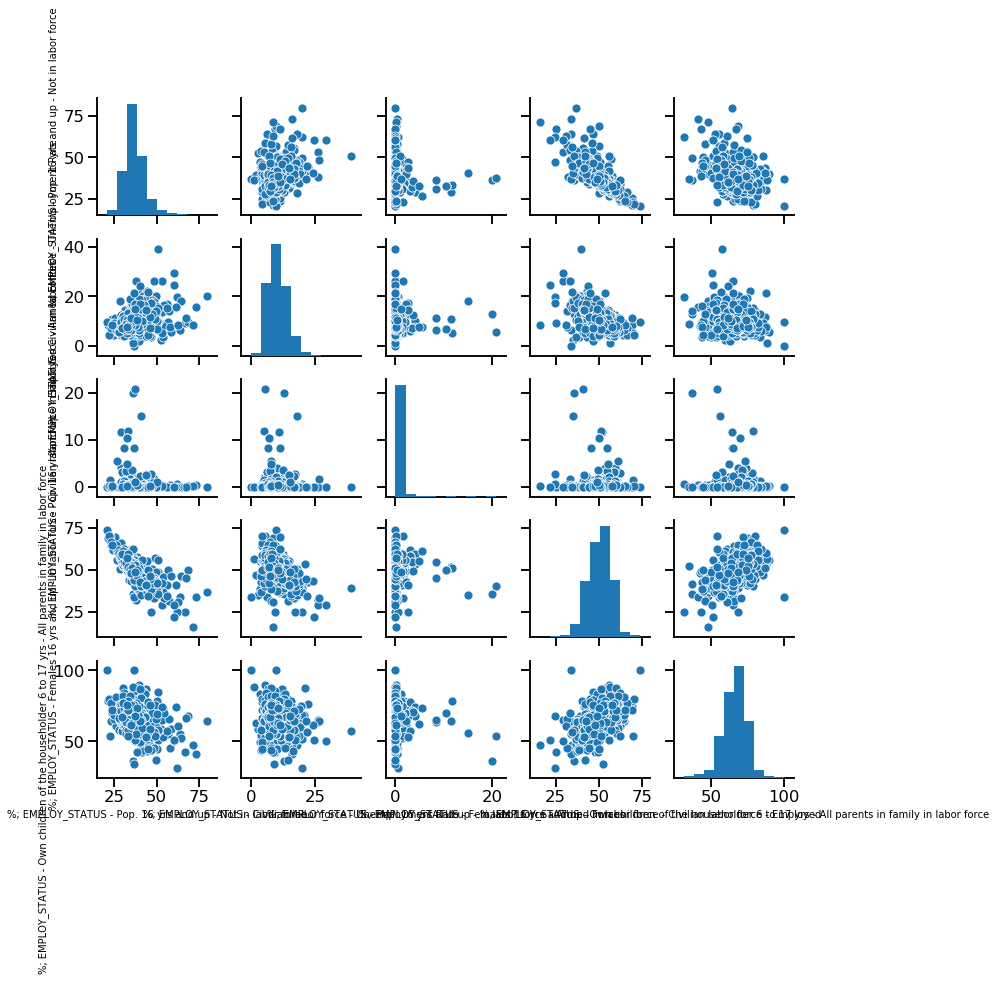

<IPython.core.display.Javascript object>

In [749]:
sns.pairplot(df_state_info_gs_census[col_census_pct_employstatus_final]);

### Percentage of families below poverty line columns

In [750]:
col_census_pct_povertyline = [col for col in col_census_pct if "AGE_FAMILIES_INCOME_BELOW_POVERTY" in col]
df_state_info_gs_census[col_census_pct_povertyline].corr(method="pearson")

,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18 yrs and up,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18-64 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - People in families,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - Unrelated individuals 15 yrs and up,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families - w/ related children of the householder <18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All people,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families - w/ related children of the householder <18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs - Related children of the householder <18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs - Related children of the householder <18 yrs - Related children of the householder 5 to 17 yrs
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18 yrs and up,1.000000,0.990275,0.719641,0.912862,0.794789,0.911926,0.894752,0.983803,0.858332,0.841118,0.878871,0.877316,0.870246
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18-64 yrs,0.990275,1.000000,0.630137,0.896531,0.791225,0.890439,0.886485,0.973040,0.825308,0.826554,0.865936,0.864218,0.852152
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up,0.719641,0.630137,1.000000,0.698551,0.519170,0.719201,0.679474,0.709829,0.741193,0.671371,0.674921,0.676002,0.688165
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - People in families,0.912862,0.896531,0.698551,1.000000,0.693034,0.990059,0.973432,0.963565,0.939501,0.931383,0.972071,0.972725,0.962008
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - Unrelated individuals 15 yrs and up,0.794789,0.791225,0.519170,0.693034,1.000000,0.706891,0.674122,0.777425,0.661355,0.635394,0.666776,0.663475,0.653271
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families,0.911926,0.890439,0.719201,0.990059,0.706891,1.000000,0.964051,0.956300,0.951086,0.918930,0.949995,0.950626,0.940898
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families - w/ related children of the householder <18 yrs,0.894752,0.886485,0.679474,0.973432,0.674122,0.964051,1.000000,0.947465,0.895945,0.927222,0.983948,0.984276,0.971768
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All people,0.983803,0.973040,0.709829,0.963565,0.777425,0.956300,0.947465,1.000000,0.896731,0.889591,0.943442,0.942085,0.933204
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families,0.858332,0.825308,0.741193,0.939501,0.661355,0.951086,0.895945,0.896731,1.000000,0.951622,0.885469,0.886614,0.878588
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families - w/ related children of the householder <18 yrs,0.841118,0.826554,0.671371,0.931383,0.635394,0.918930,0.927222,0.889591,0.951622,1.000000,0.915614,0.917011,0.902296


<IPython.core.display.Javascript object>

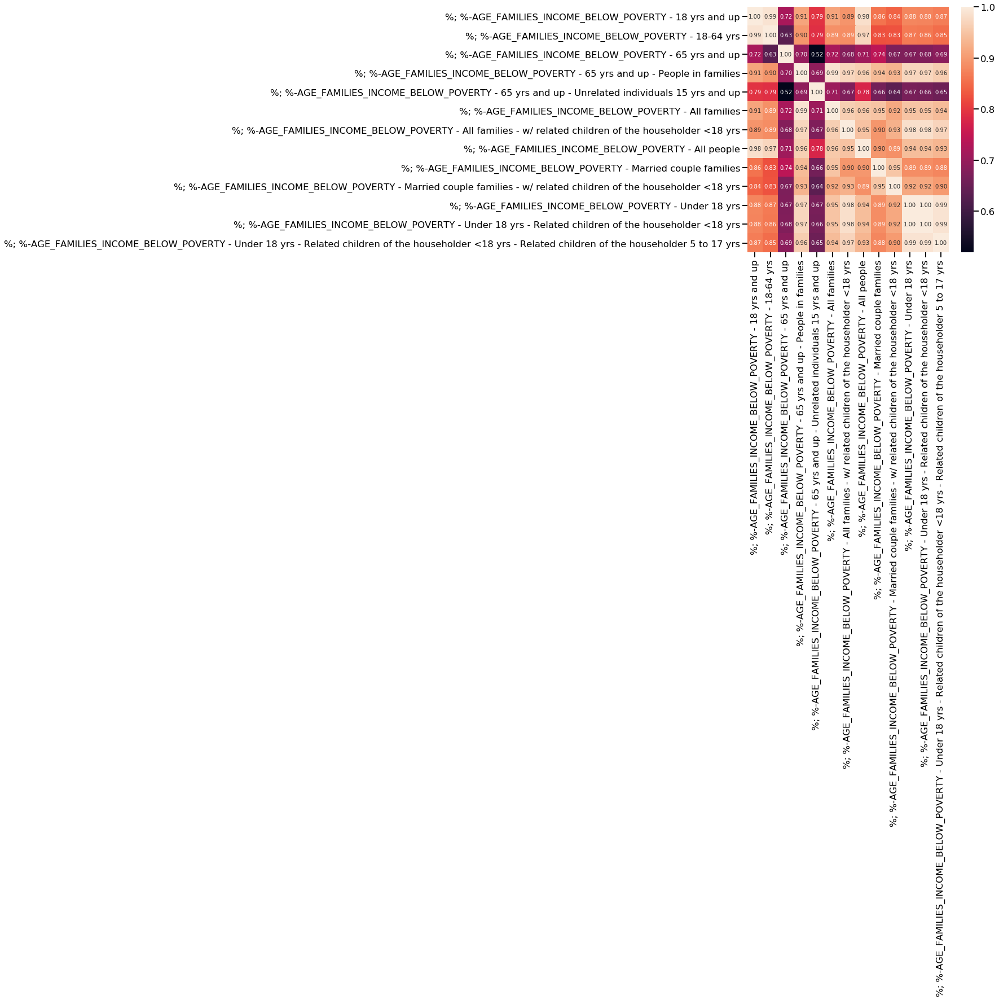

<IPython.core.display.Javascript object>

In [751]:
# Below poverty line columns
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_povertyline].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

In [752]:
# Just keep this simple - pick one element that's mostly correlated with the others
col_census_pct_povertyline_final = [
    "%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families"
]

<IPython.core.display.Javascript object>

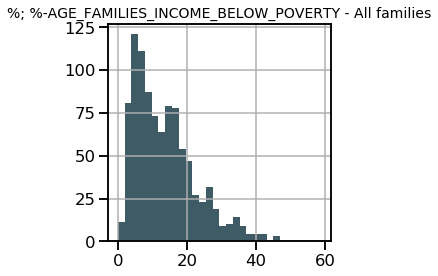

<IPython.core.display.Javascript object>

In [753]:
f, (ax1) = plt.subplots(1, 1, figsize=(4, 4))

hist_plot(
    df_state_info_gs_census,
    "%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families",
    ax1,
)


### Combine final census features, check for other correlations

Before filtering:
- INCOME_BENEFITS - percentage (28 columns) - check for redundant columns and correlated and anti-correlated features
- INCOME_BENEFITS - estimated values - (12 columns) - manually select features
- HEALTH_INS_COVERAGE (17 columns) - manually select columns
- WORK_COMMUTE - adds to 100% (6 columns) - interesting to keep, but drop rare categories
- OCCUPATION - adds to 100% (5 columns) - perhaps drop - may be redundant with industry
- INDUSTRY - adds to 100% (13 columns) - interesting to keep but inspect
- WORKER_CLASS - adds to 100% (4 columns) - OK to keep but inspect
- EMPLOY_STATUS - (12 columns) - OK to keep but inspect
- %-AGE_FAMILIES_INCOME_BELOW_POVERTY (13 columns) - follow up

After filtering:
- INCOME_BENEFITS - percentage (3 columns)
- INCOME_BENEFITS - estimated values - (3 columns)
- HEALTH_INS_COVERAGE (3 columns)
- WORK_COMMUTE - (5 columns)
- OCCUPATION - (0 columns)
- INDUSTRY - (13 columns)
- WORKER_CLASS - (2 columns)
- EMPLOY_STATUS - (5 columns)
- %-AGE_FAMILIES_INCOME_BELOW_POVERTY (1 columns)

In [755]:
print(
    "\n income benefits, percentage - ",
    len(col_census_pct_ib_final),
    "\n income benefits, estimated - ",
    len(col_census_est_ib_final),
    "\n health insurance - ",
    len(col_census_pct_hi_final),
    "\n work commute - ",
    len(col_census_pct_wc_final),
    "\n industry - ",
    len(col_census_pct_industry_final),
#     "\n occupation - ",
#     len(col_census_pct_occ_final),
    "\n worker class - ",
    len(col_census_pct_workerclass_final),
    "\n employment status - ",
    len(col_census_pct_employstatus_final),
    "\n percent below poverty line - ",
    len(col_census_pct_povertyline_final),
)


 income benefits, percentage -  3 
 income benefits, estimated -  3 
 health insurance -  3 
 work commute -  5 
 industry -  12 
 worker class -  2 
 employment status -  5 
 percent below poverty line -  1


<IPython.core.display.Javascript object>

In [756]:
census_col_final = (
    col_census_pct_ib_final
    + col_census_est_ib_final
    + col_census_pct_hi_final
    + col_census_pct_wc_final
    + col_census_pct_industry_final
    #+ col_census_pct_occ_final
    + col_census_pct_workerclass_final
    + col_census_pct_employstatus_final
    + col_census_pct_povertyline_final
)

<IPython.core.display.Javascript object>

In [758]:
df_state_info_gs_census[census_col_final].corr(method="pearson")

,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,%; INCOME_BENEFITS - w/ Social Security,%; INCOME_BENEFITS - w/ Supplemental Security Income,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage,"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",...,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families
%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,1.000000,-0.093784,0.682967,-0.739627,-0.613293,-0.172544,-0.638951,0.818186,0.304973,-0.186951,...,0.347970,0.203296,0.144614,-0.260734,0.360213,0.713334,-0.092241,-0.599515,-0.349218,0.875569
%; INCOME_BENEFITS - w/ Social Security,-0.093784,1.000000,0.064106,-0.029938,0.153095,0.077558,0.257409,0.332362,0.012565,0.253736,...,-0.041595,-0.179597,-0.396679,0.309064,0.553553,0.073687,-0.069806,-0.357951,-0.011883,-0.200087
%; INCOME_BENEFITS - w/ Supplemental Security Income,0.682967,0.064106,1.000000,-0.681637,-0.552646,-0.161681,-0.491341,0.727609,0.263634,-0.200603,...,0.317259,0.061618,0.024827,-0.128754,0.381105,0.596633,-0.124250,-0.487533,-0.240335,0.655592
Est.; INCOME_BENEFITS - Total households - Median household income ($),-0.739627,-0.029938,-0.681637,1.000000,0.666926,0.247840,0.751227,-0.799775,-0.521723,0.263633,...,-0.307369,-0.064630,0.019229,0.085928,-0.381085,-0.643201,0.037332,0.512248,0.204314,-0.789473
Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),-0.613293,0.153095,-0.552646,0.666926,1.000000,0.168374,0.677078,-0.545649,-0.411266,0.196685,...,-0.339293,-0.220919,-0.268106,0.217671,-0.121236,-0.487952,0.117180,0.334031,0.180706,-0.627236
Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),-0.172544,0.077558,-0.161681,0.247840,0.168374,1.000000,0.182249,-0.136799,-0.170352,0.060745,...,-0.184450,0.008846,0.016864,0.060054,-0.040772,-0.149782,0.047204,0.041350,-0.062375,-0.166123
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,-0.638951,0.257409,-0.491341,0.751227,0.677078,0.182249,1.000000,-0.581482,-0.653922,0.350637,...,-0.214962,-0.249029,-0.354569,0.033838,-0.088356,-0.459369,0.121223,0.324736,0.265205,-0.758860
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,0.818186,0.332362,0.727609,-0.799775,-0.545649,-0.136799,-0.581482,1.000000,0.331349,-0.169531,...,0.236128,0.054149,-0.022912,-0.000292,0.568117,0.657496,-0.120243,-0.677727,-0.323639,0.769088
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage,0.304973,0.012565,0.263634,-0.521723,-0.411266,-0.170352,-0.653922,0.331349,1.000000,-0.159724,...,0.122207,0.053434,0.060766,0.065777,0.176923,0.345053,-0.032836,-0.238073,-0.15

<IPython.core.display.Javascript object>

In [435]:
# Noticed that this feature had a very high VIF in the end despite not having a high correlation in the industry check
# df_state_info_gs_census[census_col_final].corr(method="pearson")['%; INDUSTRY - Civilian employed pop. 16 yrs and up - Arts, entertainment, and recreation, and accommodation and food services'].sort_values(ascending=False)

<IPython.core.display.Javascript object>

In [759]:
print("No. of census features ", len(census_col_final))

No. of census features  34


<IPython.core.display.Javascript object>

In [760]:
def melt_corr_df(df_corr):
    df = df_corr.where(np.triu(np.ones(df_corr.shape)).astype(np.bool))
    df = df.stack().reset_index()
    df.columns = ["Row", "Column", "Pearson r"]

    # Remove self-correlated Pearson r
    df = df[df["Pearson r"] != 1].copy()

    return df

<IPython.core.display.Javascript object>

In [761]:
df_corr_melted_census = melt_corr_df(
    df_state_info_gs_census[census_col_final].corr(method="pearson")
)

<IPython.core.display.Javascript object>

In [762]:
df_corr_melted_census.sort_values(by="Pearson r", ascending=False).head(10)

,Row,Column,Pearson r
33,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,0.875569
7,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.818186
243,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,0.769088
102,Est.; INCOME_BENEFITS - Total households - Med...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.751227
72,%; INCOME_BENEFITS - w/ Supplemental Security ...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.727609
29,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; EMPLOY_STATUS - Civilian labor force - Unem...,0.713334
2,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; INCOME_BENEFITS - w/ Supplemental Security ...,0.682967
132,Est.; INCOME_BENEFITS - w/ retirement income -...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.677078
100,Est.; INCOME_BENEFITS - Total households - Med...,Est.; INCOME_BENEFITS - w/ retirement income -...,0.666926
239,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; EMPLOY_STATUS - Civilian labor force - Unem...,0.657496


<IPython.core.display.Javascript object>

In [763]:
[print(i) for i in df_corr_melted_census.sort_values(by="Pearson r", ascending=False).head(10)['Row']]

%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months
%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage
Est.; INCOME_BENEFITS - Total households - Median household income ($)
%; INCOME_BENEFITS - w/ Supplemental Security Income
%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months
%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months
Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)
Est.; INCOME_BENEFITS - Total households - Median household income ($)
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage


[None, None, None, None, None, None, None, None, None, None]

<IPython.core.display.Javascript object>

In [764]:
[print(i) for i in df_corr_melted_census.sort_values(by="Pearson r", ascending=False).head(10)['Column']]

%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage
%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate
%; INCOME_BENEFITS - w/ Supplemental Security Income
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage
Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)
%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate


[None, None, None, None, None, None, None, None, None, None]

<IPython.core.display.Javascript object>

In [765]:
df_corr_melted_census.sort_values(by="Pearson r", ascending=False).tail(10)

,Row,Column,Pearson r
191,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,-0.653922
241,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; EMPLOY_STATUS - Females 16 yrs and up - In ...,-0.677727
68,%; INCOME_BENEFITS - w/ Supplemental Security ...,Est.; INCOME_BENEFITS - Total households - Med...,-0.681637
521,%; INDUSTRY - Civilian employed pop. 16 yrs an...,%; WORKER_CLASS - Civilian employed pop. 16 yr...,-0.712655
3,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,Est.; INCOME_BENEFITS - Total households - Med...,-0.739627
216,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,-0.758860
577,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in...,%; EMPLOY_STATUS - Females 16 yrs and up - In ...,-0.784276
129,Est.; INCOME_BENEFITS - Total households - Med...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,-0.789473
272,"%; WORK_COMMUTE - Workers 16 yrs and up - Car,...",%; WORK_COMMUTE - Workers 16 yrs and up - Publ...,-0.796416
103,Est.; INCOME_BENEFITS - Total households - Med...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,-0.799775


<IPython.core.display.Javascript object>

In [766]:
# I'll drop the poverty line set of columns since it correlates with % of families with food stamps and it's not actionable
census_col_final_filt = (
    col_census_pct_ib_final
    + col_census_est_ib_final
    + col_census_pct_hi_final
    + col_census_pct_wc_final
    + col_census_pct_industry_final
    + col_census_pct_workerclass_final
    + col_census_pct_employstatus_final
)

<IPython.core.display.Javascript object>

In [767]:
len(census_col_final_filt)

33

<IPython.core.display.Javascript object>

In [768]:
census_col_final_filt

['%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months',
 '%; INCOME_BENEFITS - w/ Social Security',
 '%; INCOME_BENEFITS - w/ Supplemental Security Income',
 'Est.; INCOME_BENEFITS - Total households - Median household income ($)',
 'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
 'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)',
 '%; WORK_COMMUTE - Workers

<IPython.core.display.Javascript object>

## Combine census with other features and check for correlations


In [769]:
all_features_filt_wcensuscheck = census_col_final_filt + [
    "enrollment",
    "pct_URM",
    "pct_LI_students",
    "Magnet_cat_encoded",
    "Charter_cat_encoded",
    "college_readiness",
    "students_per_teacher",
    "students_per_counselor",
    "pct_teachers_3years_or_more",
    "pct_teachers_who_r_certified",
    "avg_teacher_salary",
    "test_score_rating_LIstudents",
    "test_score_rating_notLIstudents",
    "test_scores_english_LIstudents",
    "test_scores_math_LIstudents",
    "test_scores_math_LIstudents_n_students",
    "graduation_rates_gradRates_eligibility_allStudents",
    "graduation_rates_gradRates_eligibility_LIstudents",
    "graduation_rates_UCCSU_eligibility_allStudents",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    "graduation_rates_UCCSU_eligibility_nonLIstudents",
]

<IPython.core.display.Javascript object>

In [770]:
len(all_features_filt_wcensuscheck)

54

<IPython.core.display.Javascript object>

In [771]:
df_state_info_gs_census_corr = melt_corr_df(
    df_state_info_gs_census[all_features_filt_wcensuscheck].corr(method="pearson")
)

<IPython.core.display.Javascript object>

In [772]:
df_state_info_gs_census_corr.sort_values(by="Pearson r", ascending=False).head(20)

,Row,Column,Pearson r
1471,graduation_rates_gradRates_eligibility_allStud...,graduation_rates_gradRates_eligibility_LIstudents,0.971163
1481,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_nonLIstudents,0.954667
1480,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_LIstudents,0.918722
1432,test_score_rating_LIstudents,test_scores_english_LIstudents,0.917931
1433,test_score_rating_LIstudents,test_scores_math_LIstudents,0.904909
1276,pct_URM,pct_LI_students,0.860278
1483,graduation_rates_UCCSU_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_nonLIstudents,0.833248
7,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.818186
1356,college_readiness,test_score_rating_notLIstudents,0.788699
1431,test_score_rating_LIstudents,test_score_rating_notLIstudents,0.752113


<IPython.core.display.Javascript object>

In [773]:
df_state_info_gs_census_corr.sort_values(by="Pearson r", ascending=False).tail(20)

,Row,Column,Pearson r
4,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,Est.; INCOME_BENEFITS - w/ retirement income -...,-0.613293
241,Est.; INCOME_BENEFITS - w/ retirement income -...,pct_LI_students,-0.613904
1286,pct_URM,test_score_rating_notLIstudents,-0.626905
6,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,-0.638951
185,Est.; INCOME_BENEFITS - Total households - Med...,%; EMPLOY_STATUS - Civilian labor force - Unem...,-0.643201
453,"%; WORK_COMMUTE - Workers 16 yrs and up - Car,...",%; WORK_COMMUTE - Workers 16 yrs and up - Walked,-0.648986
311,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,-0.653922
1305,pct_LI_students,test_score_rating_notLIstudents,-0.666890
381,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; EMPLOY_STATUS - Females 16 yrs and up - In ...,-0.677727
108,%; INCOME_BENEFITS - w/ Supplemental Security ...,Est.; INCOME_BENEFITS - Total households - Med...,-0.681637


<IPython.core.display.Javascript object>

In [774]:
# Look at what correlates best with the target

bool_target = df_state_info_gs_census_corr["Row"].str.contains(
    "graduation_rates_UCCSU_eligibility_LIstudents"
) | df_state_info_gs_census_corr["Column"].str.contains(
    "graduation_rates_UCCSU_eligibility_LIstudents"
)

df_state_info_gs_census_corr_target = (
    df_state_info_gs_census_corr.loc[bool_target, :]
    .sort_values(by="Pearson r", ascending=False)
    .copy()
)

<IPython.core.display.Javascript object>

In [775]:
df_state_info_gs_census_corr_target

,Row,Column,Pearson r
1480,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_LIstudents,0.918722
1483,graduation_rates_UCCSU_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_nonLIstudents,0.833248
1347,Charter_cat_encoded,graduation_rates_UCCSU_eligibility_LIstudents,0.544137
580,%; WORK_COMMUTE - Workers 16 yrs and up - Publ...,graduation_rates_UCCSU_eligibility_LIstudents,0.390279
1455,test_scores_english_LIstudents,graduation_rates_UCCSU_eligibility_LIstudents,0.367764
1438,test_score_rating_LIstudents,graduation_rates_UCCSU_eligibility_LIstudents,0.355619
1462,test_scores_math_LIstudents,graduation_rates_UCCSU_eligibility_LIstudents,0.340078
955,%; INDUSTRY - Civilian employed pop. 16 yrs an...,graduation_rates_UCCSU_eligibility_LIstudents,0.261976
853,%; INDUSTRY - Civilian employed pop. 16 yrs an...,graduation_rates_UCCSU_eligibility_LIstudents,0.237757
1105,%; WORKER_CLASS - Civilian employed pop. 16 yr...,graduation_rates_UCCSU_eligibility_LIstudents,0.237368


<IPython.core.display.Javascript object>

In [776]:
# Look at what correlates with feature to evaluate

bool_f2e = df_state_info_gs_census_corr["Row"].str.contains(
    "pct_URM"
) | df_state_info_gs_census_corr["Column"].str.contains(
    "pct_URM"
)

df_state_info_gs_census_corr_f2e = (
    df_state_info_gs_census_corr.loc[bool_f2e, :]
    .sort_values(by="Pearson r", ascending=False)
    .copy()
)

df_state_info_gs_census_corr_f2e

,Row,Column,Pearson r
1276,pct_URM,pct_LI_students,0.860278
34,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,pct_URM,0.577566
1289,pct_URM,test_scores_math_LIstudents_n_students,0.510744
384,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,pct_URM,0.452544
519,"%; WORK_COMMUTE - Workers 16 yrs and up - Car,...",pct_URM,0.432137
1165,%; EMPLOY_STATUS - Civilian labor force - Unem...,pct_URM,0.425846
139,%; INCOME_BENEFITS - w/ Supplemental Security ...,pct_URM,0.396177
1030,%; INDUSTRY - Civilian employed pop. 16 yrs an...,pct_URM,0.348525
430,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,pct_URM,0.340835
1087,%; WORKER_CLASS - Civilian employed pop. 16 yr...,pct_URM,0.323350


<IPython.core.display.Javascript object>

In [777]:
[print(i) for i in df_state_info_gs_census_corr_f2e.head(10)['Row']]

pct_URM
%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months
pct_URM
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage
%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled
%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate
%; INCOME_BENEFITS - w/ Supplemental Security Income
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers


[None, None, None, None, None, None, None, None, None, None]

<IPython.core.display.Javascript object>

In [778]:
[print(i) for i in df_state_info_gs_census_corr_f2e.tail(20)['Row']]

%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration
pct_URM
%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers
pct_URM
pct_URM
%; INCOME_BENEFITS - w/ Social Security
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services
pct_URM
%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing
pct_URM
Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income (

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

<IPython.core.display.Javascript object>

## Determine VIF on manually selected features

### All filtered features

In [779]:
all_features_filt_wcensuscheck_notarget = all_features_filt_wcensuscheck[:]
all_features_filt_wcensuscheck_notarget.remove('graduation_rates_UCCSU_eligibility_LIstudents')

X_raw = df_state_info_gs_census[all_features_filt_wcensuscheck_notarget]
y_raw = df_state_info_gs_census['graduation_rates_UCCSU_eligibility_LIstudents']

<IPython.core.display.Javascript object>

In [780]:
X_filt, y_filt = filter_and_std_data(X_raw, y_raw)

No. of total schools before splitting (no null values for feature set or target):  814


<IPython.core.display.Javascript object>

In [781]:
# multiregression
X_filt_1 = sm.add_constant(X_filt)
lm = sm.OLS(endog=y_filt, exog=X_filt_1).fit()
variables = lm.model.exog

<IPython.core.display.Javascript object>

In [782]:
vif = [variance_inflation_factor(variables, i) for i in range(variables.shape[1])]

<IPython.core.display.Javascript object>

In [783]:
features_vif_vals = zip(X_raw.columns.tolist(), vif)
df_vif = pd.DataFrame(features_vif_vals)
df_vif_final_sorted = df_vif.sort_values(by=1, ascending=False)

<IPython.core.display.Javascript object>

In [785]:
df_vif_final_sorted

,0,1
45,test_score_rating_notLIstudents,25.197625
10,"%; WORK_COMMUTE - Workers 16 yrs and up - Car,...",24.836242
8,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,18.009652
52,graduation_rates_UCCSU_eligibility_nonLIstudents,17.241866
12,%; WORK_COMMUTE - Workers 16 yrs and up - Walked,15.264914
7,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,12.811037
36,Magnet_cat_encoded,12.366936
50,graduation_rates_gradRates_eligibility_LIstudents,12.362244
27,%; WORKER_CLASS - Civilian employed pop. 16 yr...,12.139492
4,Est.; INCOME_BENEFITS - w/ retirement income -...,10.879486


<IPython.core.display.Javascript object>

In [784]:
[print(i) for i in df_vif_final_sorted.iloc[0:20, 0]]

test_score_rating_notLIstudents
%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage
graduation_rates_UCCSU_eligibility_nonLIstudents
%; WORK_COMMUTE - Workers 16 yrs and up - Walked
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage
Magnet_cat_encoded
graduation_rates_gradRates_eligibility_LIstudents
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers
Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)
test_scores_math_LIstudents
%; INCOME_BENEFITS - w/ Social Security
test_scores_math_LIstudents_n_students
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction
students_per_teacher
graduation_rates_UCCSU_eligibility_allStudents
graduation_rates_gradRates_eligibility_allStudents
%; INDUSTRY - Civilian employed pop. 16 yrs and up

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

<IPython.core.display.Javascript object>

In [789]:
print('Number of remaining features: ', len(df_vif_final_sorted))

Number of remaining features:  53


<IPython.core.display.Javascript object>

# Save dataset

**While I did not remove collinearity completely, I have a reasonable set of selected features to move forward for data exploration and have model interpretability. I will save the data at this point as an intermediate data set. There are 966 schools with 53 feature columns and 1 target column.**

In [790]:
os.getcwd()

'/Users/lacar/Documents/Data_science/Jupyter_notebooks/Education_study'

<IPython.core.display.Javascript object>

## Add back school information

In [805]:
school_info_col = (['NCESDist',
                   'NCESSchool',
                   'NCESDistSchool',
                   'StatusType',
                   'County',
                   'District',
                    'School',
                    'Street',
                    'StreetAbr',
                    'City',
                    'Zip',
                    'zip_code',
                    'State',
                    'Latitude',
                    'Longitude',
                   'E12'])

<IPython.core.display.Javascript object>

## Save dataset

In [806]:
df_state_info_gs_census_200514 = df_state_info_gs_census[school_info_col + all_features_filt_wcensuscheck_notarget + ['graduation_rates_UCCSU_eligibility_LIstudents']].copy()

<IPython.core.display.Javascript object>

In [807]:
df_state_info_gs_census_200514.to_csv('data/b_intermediate/df_state_info_gs_census_200514.csv')

<IPython.core.display.Javascript object>

## ---